# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = 'data' # for windows
#data_dir = '/data' in case of Linux
#!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper
import PIL


#helper.download_extract('mnist', data_dir)
#helper.download_extract('celeba', data_dir)

## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

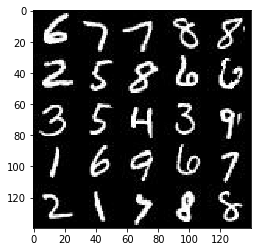

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

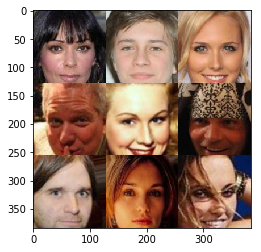

In [3]:
show_n_images = 12

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 128, 128, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.13.1
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return input_real, input_z, learning_rate



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha=0.2
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x1 = tf.nn.dropout(x1, 0.7)
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        dr2 = tf.nn.dropout(bn2, 0.7)
        relu2 = tf.maximum(alpha * dr2, dr2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        dr3 = tf.nn.dropout(bn3, 0.7)
        relu3 = tf.maximum(alpha * dr3, dr3)
        # 4x4x256
        
        x4 = tf.layers.conv2d(relu2, 1024, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn4 = tf.layers.batch_normalization(x4, training=True)
        dr4 = tf.nn.dropout(bn4, 0.7)
        relu4 = tf.maximum(alpha * dr4, dr4)        
        

        # Flatten it
        flat = tf.reshape(relu4, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits

    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/ubuntu/anaconda3/envs/tf-gpu/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3316, in run_code
    return outflag  File "<ipython-input-5-0950053b7877>", line 24, in <module>
    tests.test_model_inputs(model_inputs)  File "/home/ubuntu/AI/Udacity_Deep-GAN-Faces-Generator/problem_unittests.py", line 14, in func_wrapper
    return result  File "/home/ubuntu/AI/Udacity_Deep-GAN-Faces-Generator/problem_unittests.py", line 68, in test_model_inputs
    _check_input(learn_rate, [], 'Learning Rate')  File "/home/ubuntu/AI/Udacity_Deep-GAN-Faces-Generator/problem_unittests.py", line 38, in _check_input
    '{} has bad name.  Found name {}'.format(display_name, tensor.name)  File "

### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse = not is_train):
        x1 = tf.layers.dense(z, 4*4*1024)
       
        
        x1 = tf.reshape(x1, (-1, 4, 4, 1024))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.nn.dropout(x1, 0.7)
        x1 = tf.maximum(alpha * x1, x1)
        
        
        x2 = tf.layers.conv2d_transpose(x1, 512, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.nn.dropout(x2, 0.7)
        x2 = tf.maximum(alpha * x2, x2)
        
        
        x3 = tf.layers.conv2d_transpose(x2, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.nn.dropout(x3, 0.7)
        x3 = tf.maximum(alpha * x3, x3)
        
        x4 = tf.layers.conv2d_transpose(x3, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.nn.dropout(x4, 0.7)
        x4 = tf.maximum(alpha * x4, x4)
        

        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 5, strides=2, padding='same')
       
        out = tf.tanh(logits) 
   
    return out
    
#the other configuration for generator conv layers:

       # x1 = tf.layers.dense(z, 2*2*512)
       # x1 = tf.reshape(h1, (-1, 2, 2, 512))
       # x1 = tf.layers.batch_normalization(h1, training=is_train)
        #x1 = tf.maximum(alpha * h1, h1)
        #x1 = tf.nn.dropout(x1, 0.5)
    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
#tests.test_generator(generator, tf) #needed to turn off the unit test due to change in architecture (64x64 image size)

"\nDON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE\n"

### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function...eh this is complicated:-/
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*0.95))
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss    
    
    
    #return None, None


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Instructions for updating:
Use keras.layers.conv2d_transpose instead.
Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.figure(figsize = (6,6))
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    images_count, image_width, image_height, image_channels = data_shape
    
    input_real, input_z, l_r = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, l_r, beta1)
    
    steps = 0
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1

                # Change the range from (-0.5, 0.5) to (-1, 1) to be consistent with batch_z
                batch_images *= 2
                #print("Min/Max: {} / {}".format(np.min(batch_images), np.max(batch_images)))
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, l_r: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, l_r: learning_rate})

                if steps % 10 == 0:
                    # Get the losses and print them out after each 10 steps
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discr. Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 200 == 0:
                    show_generator_output(sess, 12, input_z, image_channels, data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

### This experiment won't work due to the size mismatch between input/output layer of the network and imagge size in the dataset

Epoch 1/2... Discr. Loss: 0.5963... Generator Loss: 4.7866
Epoch 1/2... Discr. Loss: 0.5745... Generator Loss: 2.0665
Epoch 1/2... Discr. Loss: 0.2606... Generator Loss: 6.0649
Epoch 1/2... Discr. Loss: 1.5387... Generator Loss: 1.5118
Epoch 1/2... Discr. Loss: 0.4110... Generator Loss: 2.7112
Epoch 1/2... Discr. Loss: 1.5433... Generator Loss: 0.9209
Epoch 1/2... Discr. Loss: 1.3612... Generator Loss: 2.2436
Epoch 1/2... Discr. Loss: 0.7763... Generator Loss: 1.6728
Epoch 1/2... Discr. Loss: 0.3788... Generator Loss: 2.8174
Epoch 1/2... Discr. Loss: 0.2801... Generator Loss: 3.8960


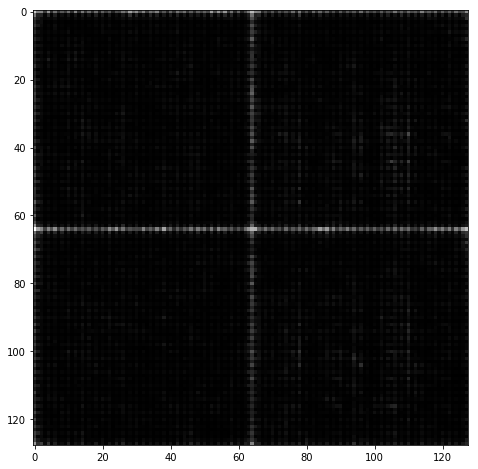

Epoch 1/2... Discr. Loss: 0.4865... Generator Loss: 3.8141
Epoch 1/2... Discr. Loss: 0.6966... Generator Loss: 1.9653
Epoch 1/2... Discr. Loss: 0.7485... Generator Loss: 1.6040
Epoch 1/2... Discr. Loss: 1.2185... Generator Loss: 0.7962
Epoch 1/2... Discr. Loss: 1.0360... Generator Loss: 1.0812
Epoch 1/2... Discr. Loss: 0.9118... Generator Loss: 1.8123
Epoch 1/2... Discr. Loss: 1.7603... Generator Loss: 1.2003
Epoch 1/2... Discr. Loss: 1.7956... Generator Loss: 0.4681
Epoch 1/2... Discr. Loss: 1.2813... Generator Loss: 3.9438
Epoch 1/2... Discr. Loss: 1.4322... Generator Loss: 0.5666


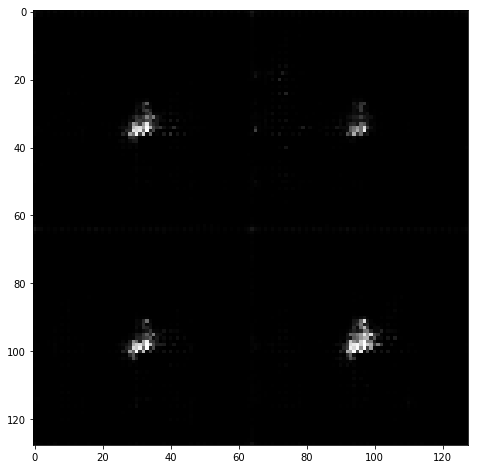

Epoch 1/2... Discr. Loss: 0.7615... Generator Loss: 1.4230
Epoch 1/2... Discr. Loss: 1.0907... Generator Loss: 1.0875
Epoch 1/2... Discr. Loss: 0.7835... Generator Loss: 1.6515
Epoch 1/2... Discr. Loss: 0.6609... Generator Loss: 1.7451
Epoch 1/2... Discr. Loss: 0.7389... Generator Loss: 1.8499
Epoch 1/2... Discr. Loss: 1.6025... Generator Loss: 0.4693
Epoch 1/2... Discr. Loss: 1.7142... Generator Loss: 0.4360
Epoch 1/2... Discr. Loss: 1.4085... Generator Loss: 3.7602
Epoch 1/2... Discr. Loss: 1.0413... Generator Loss: 1.3322
Epoch 1/2... Discr. Loss: 0.4548... Generator Loss: 2.4506


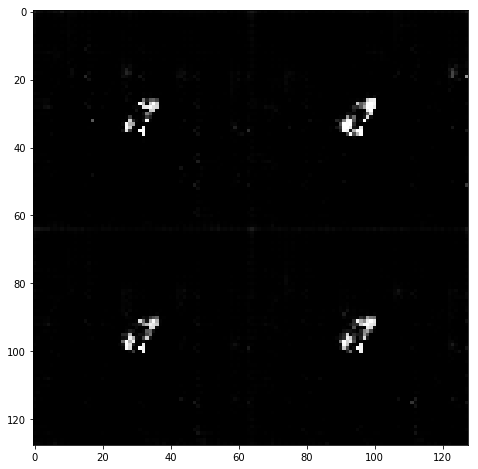

Epoch 1/2... Discr. Loss: 0.4862... Generator Loss: 2.1711
Epoch 1/2... Discr. Loss: 0.9452... Generator Loss: 1.1028
Epoch 1/2... Discr. Loss: 0.4014... Generator Loss: 2.7232
Epoch 1/2... Discr. Loss: 0.4919... Generator Loss: 2.2323
Epoch 1/2... Discr. Loss: 0.8275... Generator Loss: 1.5395
Epoch 1/2... Discr. Loss: 0.6024... Generator Loss: 1.8929
Epoch 1/2... Discr. Loss: 0.4572... Generator Loss: 2.7482
Epoch 1/2... Discr. Loss: 2.1744... Generator Loss: 0.6740
Epoch 1/2... Discr. Loss: 0.8948... Generator Loss: 1.2777
Epoch 1/2... Discr. Loss: 0.5613... Generator Loss: 2.0579


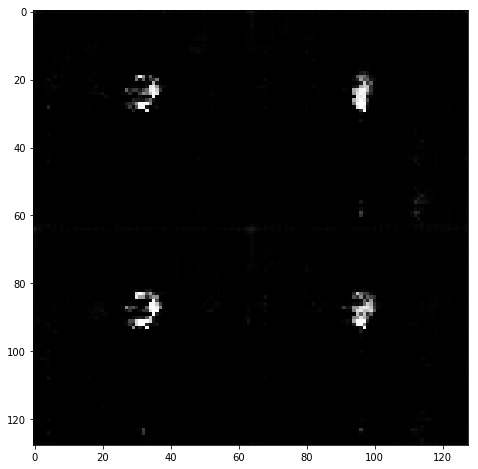

Epoch 1/2... Discr. Loss: 0.5548... Generator Loss: 1.9859
Epoch 1/2... Discr. Loss: 0.6027... Generator Loss: 2.1588
Epoch 1/2... Discr. Loss: 1.1570... Generator Loss: 1.3016
Epoch 1/2... Discr. Loss: 0.5242... Generator Loss: 2.6639
Epoch 1/2... Discr. Loss: 0.5453... Generator Loss: 2.2113
Epoch 1/2... Discr. Loss: 0.4690... Generator Loss: 2.5631
Epoch 2/2... Discr. Loss: 0.4348... Generator Loss: 2.5348
Epoch 2/2... Discr. Loss: 0.4770... Generator Loss: 3.1476
Epoch 2/2... Discr. Loss: 1.6181... Generator Loss: 0.7179
Epoch 2/2... Discr. Loss: 1.5583... Generator Loss: 1.2574


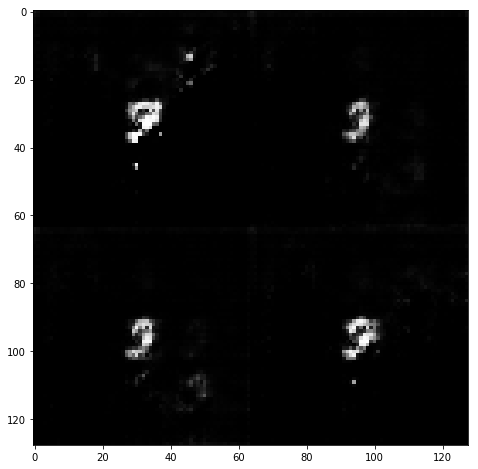

Epoch 2/2... Discr. Loss: 1.1583... Generator Loss: 0.7710
Epoch 2/2... Discr. Loss: 1.8234... Generator Loss: 0.3975
Epoch 2/2... Discr. Loss: 0.8932... Generator Loss: 1.4939
Epoch 2/2... Discr. Loss: 1.1957... Generator Loss: 0.8844
Epoch 2/2... Discr. Loss: 0.6687... Generator Loss: 2.4583
Epoch 2/2... Discr. Loss: 1.3111... Generator Loss: 0.8809
Epoch 2/2... Discr. Loss: 1.3293... Generator Loss: 0.5739
Epoch 2/2... Discr. Loss: 0.4913... Generator Loss: 1.9209
Epoch 2/2... Discr. Loss: 0.3397... Generator Loss: 2.8086
Epoch 2/2... Discr. Loss: 1.2835... Generator Loss: 4.0794


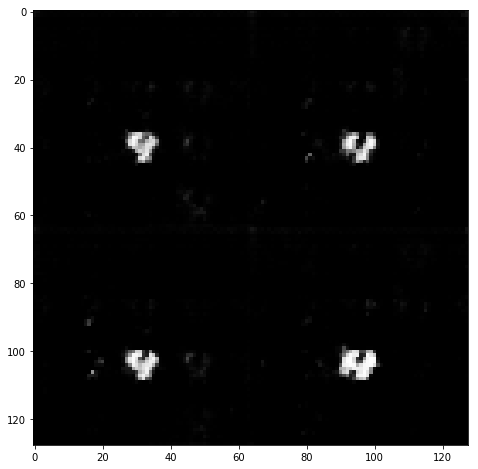

Epoch 2/2... Discr. Loss: 0.5630... Generator Loss: 1.9393
Epoch 2/2... Discr. Loss: 0.7608... Generator Loss: 1.3379
Epoch 2/2... Discr. Loss: 0.4228... Generator Loss: 2.3381
Epoch 2/2... Discr. Loss: 0.8551... Generator Loss: 1.4389
Epoch 2/2... Discr. Loss: 1.2923... Generator Loss: 2.6360
Epoch 2/2... Discr. Loss: 1.0722... Generator Loss: 1.3658
Epoch 2/2... Discr. Loss: 1.6220... Generator Loss: 2.1804
Epoch 2/2... Discr. Loss: 0.4581... Generator Loss: 2.0055
Epoch 2/2... Discr. Loss: 0.4797... Generator Loss: 2.2678
Epoch 2/2... Discr. Loss: 0.3536... Generator Loss: 2.9217


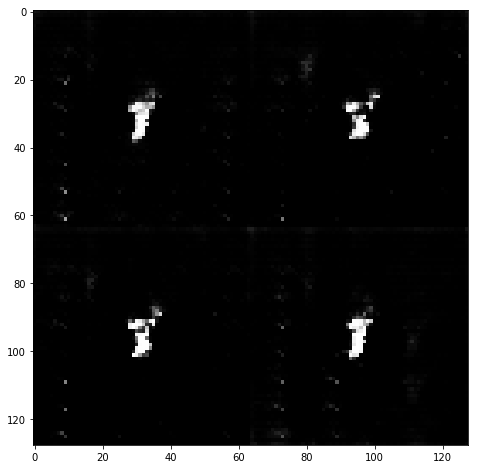

Epoch 2/2... Discr. Loss: 0.5162... Generator Loss: 2.0455
Epoch 2/2... Discr. Loss: 0.7559... Generator Loss: 1.5897
Epoch 2/2... Discr. Loss: 0.8116... Generator Loss: 1.4023
Epoch 2/2... Discr. Loss: 0.5916... Generator Loss: 1.8203
Epoch 2/2... Discr. Loss: 0.3276... Generator Loss: 2.9881
Epoch 2/2... Discr. Loss: 0.5720... Generator Loss: 1.7261
Epoch 2/2... Discr. Loss: 0.4342... Generator Loss: 2.8347
Epoch 2/2... Discr. Loss: 1.5122... Generator Loss: 0.4827
Epoch 2/2... Discr. Loss: 1.1584... Generator Loss: 0.8358
Epoch 2/2... Discr. Loss: 1.3728... Generator Loss: 0.6579


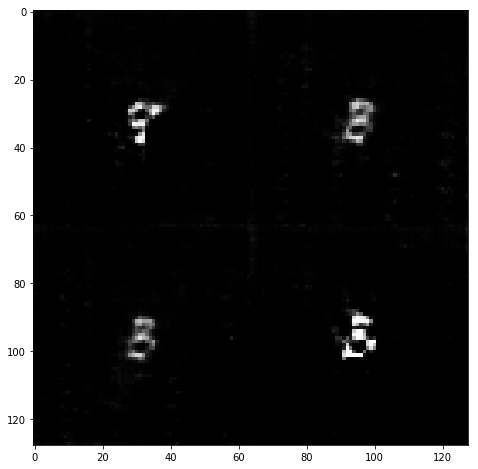

Epoch 2/2... Discr. Loss: 0.6940... Generator Loss: 1.5727
Epoch 2/2... Discr. Loss: 0.5211... Generator Loss: 1.9630
Epoch 2/2... Discr. Loss: 0.6477... Generator Loss: 1.6479
Epoch 2/2... Discr. Loss: 0.4418... Generator Loss: 2.6341
Epoch 2/2... Discr. Loss: 0.8329... Generator Loss: 1.2348
Epoch 2/2... Discr. Loss: 0.6652... Generator Loss: 1.7993
Epoch 2/2... Discr. Loss: 0.4574... Generator Loss: 2.5585
Epoch 2/2... Discr. Loss: 0.4878... Generator Loss: 2.3180
Epoch 2/2... Discr. Loss: 0.4347... Generator Loss: 2.2164
Epoch 2/2... Discr. Loss: 0.3848... Generator Loss: 2.6361


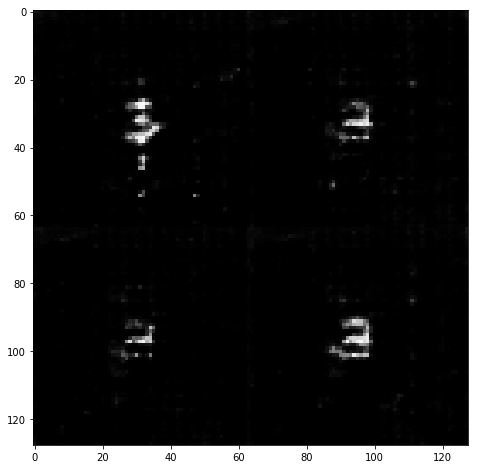

Epoch 2/2... Discr. Loss: 1.1635... Generator Loss: 3.1266
Epoch 2/2... Discr. Loss: 0.4716... Generator Loss: 2.2024
Epoch 2/2... Discr. Loss: 0.5672... Generator Loss: 1.7314


In [12]:
batch_size = 128
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset64('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/10... Discr. Loss: 3.0167... Generator Loss: 0.5112
Epoch 1/10... Discr. Loss: 0.9707... Generator Loss: 1.6087
Epoch 1/10... Discr. Loss: 1.4174... Generator Loss: 1.2023
Epoch 1/10... Discr. Loss: 1.1025... Generator Loss: 1.2238
Epoch 1/10... Discr. Loss: 0.8428... Generator Loss: 2.4017
Epoch 1/10... Discr. Loss: 0.5919... Generator Loss: 1.9352
Epoch 1/10... Discr. Loss: 0.7155... Generator Loss: 2.8574
Epoch 1/10... Discr. Loss: 1.0926... Generator Loss: 1.3777
Epoch 1/10... Discr. Loss: 0.5441... Generator Loss: 2.1490
Epoch 1/10... Discr. Loss: 0.9841... Generator Loss: 1.8895
Epoch 1/10... Discr. Loss: 0.7507... Generator Loss: 2.0053
Epoch 1/10... Discr. Loss: 1.0740... Generator Loss: 2.6602
Epoch 1/10... Discr. Loss: 0.9874... Generator Loss: 1.6458
Epoch 1/10... Discr. Loss: 0.8774... Generator Loss: 1.7950
Epoch 1/10... Discr. Loss: 0.6006... Generator Loss: 1.7447
Epoch 1/10... Discr. Loss: 0.8582... Generator Loss: 1.8123
Epoch 1/10... Discr. Loss: 0.7961... Gen

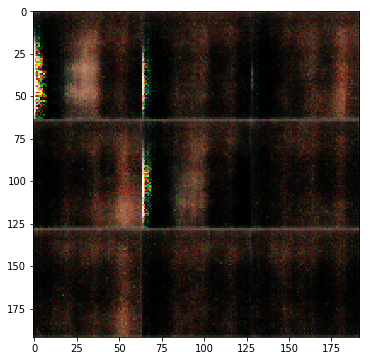

Epoch 1/10... Discr. Loss: 0.8555... Generator Loss: 3.2438
Epoch 1/10... Discr. Loss: 0.7399... Generator Loss: 1.8940
Epoch 1/10... Discr. Loss: 0.9923... Generator Loss: 1.1557
Epoch 1/10... Discr. Loss: 0.6762... Generator Loss: 2.7526
Epoch 1/10... Discr. Loss: 0.9603... Generator Loss: 1.4961
Epoch 1/10... Discr. Loss: 1.1859... Generator Loss: 2.4827
Epoch 1/10... Discr. Loss: 0.8944... Generator Loss: 1.4364
Epoch 1/10... Discr. Loss: 0.8592... Generator Loss: 1.7466
Epoch 1/10... Discr. Loss: 0.9820... Generator Loss: 1.4022
Epoch 1/10... Discr. Loss: 1.0528... Generator Loss: 0.9888
Epoch 1/10... Discr. Loss: 1.0268... Generator Loss: 0.9953
Epoch 1/10... Discr. Loss: 0.8443... Generator Loss: 1.3710
Epoch 1/10... Discr. Loss: 0.7341... Generator Loss: 2.4974
Epoch 1/10... Discr. Loss: 0.8848... Generator Loss: 1.2140
Epoch 1/10... Discr. Loss: 0.7962... Generator Loss: 1.5292
Epoch 1/10... Discr. Loss: 1.0667... Generator Loss: 2.7324
Epoch 1/10... Discr. Loss: 0.6637... Gen

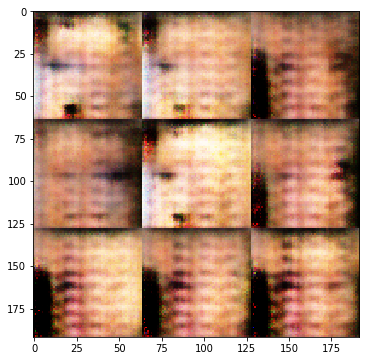

Epoch 1/10... Discr. Loss: 1.1492... Generator Loss: 2.0816
Epoch 1/10... Discr. Loss: 0.9916... Generator Loss: 1.3099
Epoch 1/10... Discr. Loss: 0.8694... Generator Loss: 1.6923
Epoch 1/10... Discr. Loss: 1.0761... Generator Loss: 1.2918
Epoch 1/10... Discr. Loss: 0.9130... Generator Loss: 1.3191
Epoch 1/10... Discr. Loss: 1.0102... Generator Loss: 1.4888
Epoch 1/10... Discr. Loss: 1.1882... Generator Loss: 0.9556
Epoch 1/10... Discr. Loss: 1.2363... Generator Loss: 2.1770
Epoch 1/10... Discr. Loss: 1.0561... Generator Loss: 1.1630
Epoch 1/10... Discr. Loss: 0.9945... Generator Loss: 1.5294
Epoch 1/10... Discr. Loss: 1.3659... Generator Loss: 0.7485
Epoch 1/10... Discr. Loss: 0.7575... Generator Loss: 1.7910
Epoch 1/10... Discr. Loss: 1.1682... Generator Loss: 1.0163
Epoch 1/10... Discr. Loss: 1.1737... Generator Loss: 1.2103
Epoch 1/10... Discr. Loss: 1.0472... Generator Loss: 1.0718
Epoch 1/10... Discr. Loss: 0.8515... Generator Loss: 1.5522
Epoch 1/10... Discr. Loss: 1.1414... Gen

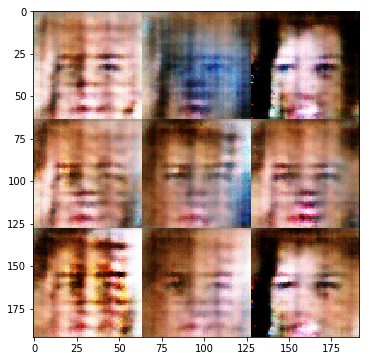

Epoch 1/10... Discr. Loss: 1.5597... Generator Loss: 2.9068
Epoch 1/10... Discr. Loss: 1.1282... Generator Loss: 1.6828
Epoch 1/10... Discr. Loss: 1.4622... Generator Loss: 2.3132
Epoch 1/10... Discr. Loss: 0.9868... Generator Loss: 1.5154
Epoch 1/10... Discr. Loss: 1.0108... Generator Loss: 1.2655
Epoch 1/10... Discr. Loss: 0.9863... Generator Loss: 1.6656
Epoch 1/10... Discr. Loss: 1.0136... Generator Loss: 1.1286
Epoch 1/10... Discr. Loss: 0.9562... Generator Loss: 2.2422
Epoch 1/10... Discr. Loss: 0.9545... Generator Loss: 1.3964
Epoch 1/10... Discr. Loss: 1.2435... Generator Loss: 1.0146
Epoch 1/10... Discr. Loss: 1.0873... Generator Loss: 1.1921
Epoch 1/10... Discr. Loss: 0.8503... Generator Loss: 1.2669
Epoch 1/10... Discr. Loss: 1.1974... Generator Loss: 1.0777
Epoch 1/10... Discr. Loss: 0.9942... Generator Loss: 1.0751
Epoch 1/10... Discr. Loss: 1.0313... Generator Loss: 1.2349
Epoch 1/10... Discr. Loss: 0.9677... Generator Loss: 1.5623
Epoch 1/10... Discr. Loss: 0.9961... Gen

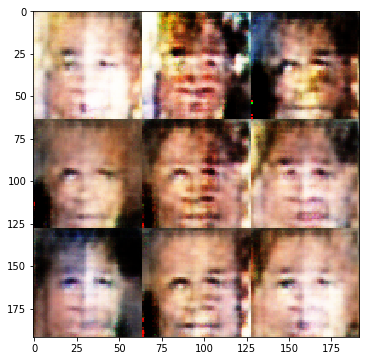

Epoch 1/10... Discr. Loss: 1.0600... Generator Loss: 1.2577
Epoch 1/10... Discr. Loss: 1.0495... Generator Loss: 1.2266
Epoch 1/10... Discr. Loss: 0.8852... Generator Loss: 1.2929
Epoch 1/10... Discr. Loss: 0.9548... Generator Loss: 1.5664
Epoch 1/10... Discr. Loss: 1.0638... Generator Loss: 1.0825
Epoch 1/10... Discr. Loss: 1.4102... Generator Loss: 2.0857
Epoch 1/10... Discr. Loss: 1.0211... Generator Loss: 1.1305
Epoch 1/10... Discr. Loss: 1.0516... Generator Loss: 1.0049
Epoch 1/10... Discr. Loss: 1.2492... Generator Loss: 1.5599
Epoch 1/10... Discr. Loss: 1.3095... Generator Loss: 0.6111
Epoch 1/10... Discr. Loss: 1.0755... Generator Loss: 1.0274
Epoch 1/10... Discr. Loss: 1.0928... Generator Loss: 1.5431
Epoch 1/10... Discr. Loss: 0.9354... Generator Loss: 1.3735
Epoch 1/10... Discr. Loss: 1.2453... Generator Loss: 2.0420
Epoch 1/10... Discr. Loss: 1.1386... Generator Loss: 0.9271
Epoch 1/10... Discr. Loss: 1.1759... Generator Loss: 1.9319
Epoch 1/10... Discr. Loss: 1.0607... Gen

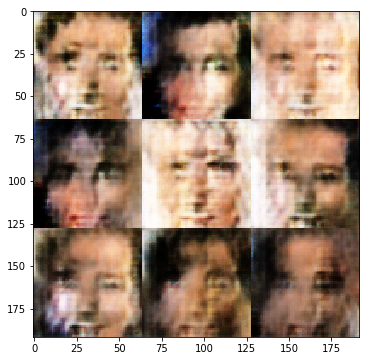

Epoch 1/10... Discr. Loss: 1.0027... Generator Loss: 1.2943
Epoch 1/10... Discr. Loss: 0.9305... Generator Loss: 1.7821
Epoch 1/10... Discr. Loss: 0.9957... Generator Loss: 0.9751
Epoch 1/10... Discr. Loss: 0.9350... Generator Loss: 1.2463
Epoch 1/10... Discr. Loss: 0.9536... Generator Loss: 1.5959
Epoch 1/10... Discr. Loss: 1.0801... Generator Loss: 0.9847
Epoch 1/10... Discr. Loss: 1.0400... Generator Loss: 1.4507
Epoch 1/10... Discr. Loss: 1.1459... Generator Loss: 1.1983
Epoch 1/10... Discr. Loss: 1.0907... Generator Loss: 1.8643
Epoch 1/10... Discr. Loss: 1.0301... Generator Loss: 1.9387
Epoch 1/10... Discr. Loss: 0.9354... Generator Loss: 1.2403
Epoch 1/10... Discr. Loss: 0.8881... Generator Loss: 1.4485
Epoch 1/10... Discr. Loss: 0.8424... Generator Loss: 1.7591
Epoch 1/10... Discr. Loss: 1.1373... Generator Loss: 0.8915
Epoch 1/10... Discr. Loss: 0.9456... Generator Loss: 1.3501
Epoch 1/10... Discr. Loss: 0.9929... Generator Loss: 1.2867
Epoch 1/10... Discr. Loss: 1.0847... Gen

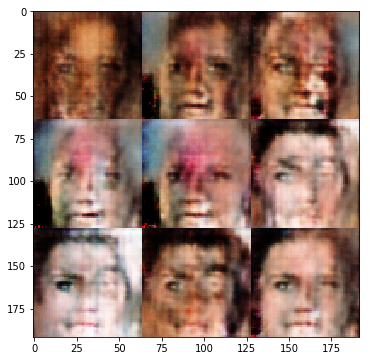

Epoch 1/10... Discr. Loss: 1.1946... Generator Loss: 1.8651
Epoch 1/10... Discr. Loss: 1.0739... Generator Loss: 1.7509
Epoch 1/10... Discr. Loss: 1.6423... Generator Loss: 2.3466
Epoch 1/10... Discr. Loss: 1.1982... Generator Loss: 0.8810
Epoch 1/10... Discr. Loss: 1.0180... Generator Loss: 1.2665
Epoch 1/10... Discr. Loss: 0.9672... Generator Loss: 1.4120
Epoch 1/10... Discr. Loss: 1.0121... Generator Loss: 1.4156
Epoch 1/10... Discr. Loss: 1.0263... Generator Loss: 1.4891
Epoch 1/10... Discr. Loss: 1.0502... Generator Loss: 1.5367
Epoch 1/10... Discr. Loss: 1.0344... Generator Loss: 1.7202
Epoch 1/10... Discr. Loss: 1.0533... Generator Loss: 1.6698
Epoch 1/10... Discr. Loss: 1.0009... Generator Loss: 1.7556
Epoch 1/10... Discr. Loss: 1.0710... Generator Loss: 0.9771
Epoch 1/10... Discr. Loss: 1.0068... Generator Loss: 1.1952
Epoch 1/10... Discr. Loss: 0.9919... Generator Loss: 1.3682
Epoch 1/10... Discr. Loss: 1.0116... Generator Loss: 1.5516
Epoch 1/10... Discr. Loss: 0.9257... Gen

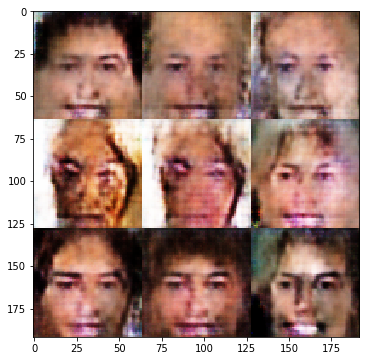

Epoch 1/10... Discr. Loss: 0.8389... Generator Loss: 1.7410
Epoch 1/10... Discr. Loss: 1.3233... Generator Loss: 0.8024
Epoch 1/10... Discr. Loss: 0.8666... Generator Loss: 1.4070
Epoch 1/10... Discr. Loss: 0.9700... Generator Loss: 1.6821
Epoch 1/10... Discr. Loss: 0.9100... Generator Loss: 1.6099
Epoch 1/10... Discr. Loss: 0.8895... Generator Loss: 1.4200
Epoch 1/10... Discr. Loss: 0.8753... Generator Loss: 1.5184
Epoch 1/10... Discr. Loss: 1.1620... Generator Loss: 1.6041
Epoch 1/10... Discr. Loss: 1.0960... Generator Loss: 0.9622
Epoch 1/10... Discr. Loss: 1.0459... Generator Loss: 1.2034
Epoch 1/10... Discr. Loss: 1.0981... Generator Loss: 1.2002
Epoch 1/10... Discr. Loss: 0.9558... Generator Loss: 1.4407
Epoch 1/10... Discr. Loss: 1.0471... Generator Loss: 1.0644
Epoch 1/10... Discr. Loss: 0.9404... Generator Loss: 1.3433
Epoch 1/10... Discr. Loss: 1.4581... Generator Loss: 2.6717
Epoch 1/10... Discr. Loss: 0.9189... Generator Loss: 1.3936
Epoch 1/10... Discr. Loss: 1.0348... Gen

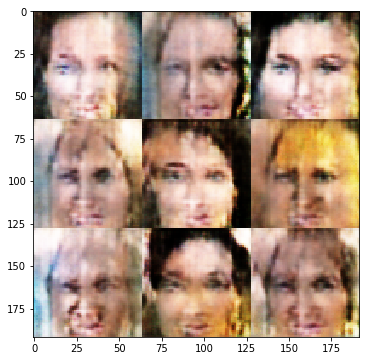

Epoch 2/10... Discr. Loss: 1.2195... Generator Loss: 1.2373
Epoch 2/10... Discr. Loss: 0.9213... Generator Loss: 1.3908
Epoch 2/10... Discr. Loss: 0.9521... Generator Loss: 1.3615
Epoch 2/10... Discr. Loss: 1.0175... Generator Loss: 1.2913
Epoch 2/10... Discr. Loss: 1.0680... Generator Loss: 1.5936
Epoch 2/10... Discr. Loss: 1.0098... Generator Loss: 1.2889
Epoch 2/10... Discr. Loss: 0.9886... Generator Loss: 1.2747
Epoch 2/10... Discr. Loss: 0.9795... Generator Loss: 1.4918
Epoch 2/10... Discr. Loss: 1.0416... Generator Loss: 1.1678
Epoch 2/10... Discr. Loss: 0.9505... Generator Loss: 1.4033
Epoch 2/10... Discr. Loss: 1.0909... Generator Loss: 1.6300
Epoch 2/10... Discr. Loss: 1.1184... Generator Loss: 1.4302
Epoch 2/10... Discr. Loss: 0.8422... Generator Loss: 1.4861
Epoch 2/10... Discr. Loss: 1.1593... Generator Loss: 0.9475
Epoch 2/10... Discr. Loss: 0.9657... Generator Loss: 1.5640
Epoch 2/10... Discr. Loss: 1.1801... Generator Loss: 1.0406
Epoch 2/10... Discr. Loss: 0.9446... Gen

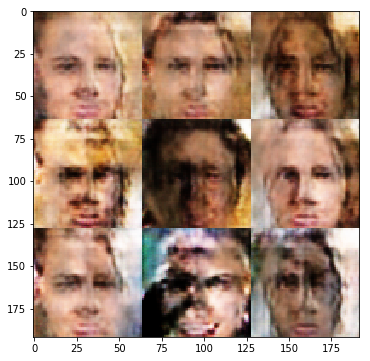

Epoch 2/10... Discr. Loss: 1.1628... Generator Loss: 1.0203
Epoch 2/10... Discr. Loss: 1.0793... Generator Loss: 1.2925
Epoch 2/10... Discr. Loss: 0.9189... Generator Loss: 1.3639
Epoch 2/10... Discr. Loss: 0.9090... Generator Loss: 1.7495
Epoch 2/10... Discr. Loss: 1.6776... Generator Loss: 0.6894
Epoch 2/10... Discr. Loss: 0.9335... Generator Loss: 1.5288
Epoch 2/10... Discr. Loss: 1.1344... Generator Loss: 0.8604
Epoch 2/10... Discr. Loss: 1.1890... Generator Loss: 1.1000
Epoch 2/10... Discr. Loss: 0.9260... Generator Loss: 1.5434
Epoch 2/10... Discr. Loss: 1.0542... Generator Loss: 1.7041
Epoch 2/10... Discr. Loss: 0.9738... Generator Loss: 1.2926
Epoch 2/10... Discr. Loss: 1.0867... Generator Loss: 1.2453
Epoch 2/10... Discr. Loss: 0.8920... Generator Loss: 1.4465
Epoch 2/10... Discr. Loss: 1.0366... Generator Loss: 1.1919
Epoch 2/10... Discr. Loss: 1.2135... Generator Loss: 1.9115
Epoch 2/10... Discr. Loss: 1.0322... Generator Loss: 1.1018
Epoch 2/10... Discr. Loss: 1.1930... Gen

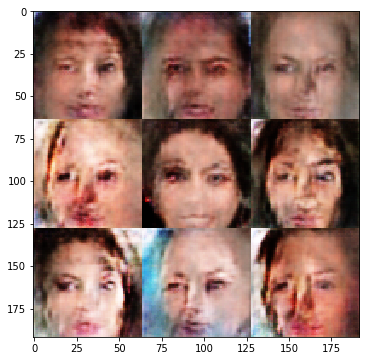

Epoch 2/10... Discr. Loss: 1.0732... Generator Loss: 1.7517
Epoch 2/10... Discr. Loss: 0.8804... Generator Loss: 1.7015
Epoch 2/10... Discr. Loss: 1.0447... Generator Loss: 1.1592
Epoch 2/10... Discr. Loss: 1.0062... Generator Loss: 1.5915
Epoch 2/10... Discr. Loss: 1.0731... Generator Loss: 1.6423
Epoch 2/10... Discr. Loss: 1.0556... Generator Loss: 1.2077
Epoch 2/10... Discr. Loss: 0.9557... Generator Loss: 1.2562
Epoch 2/10... Discr. Loss: 1.0233... Generator Loss: 1.2780
Epoch 2/10... Discr. Loss: 1.7233... Generator Loss: 2.6016
Epoch 2/10... Discr. Loss: 1.0735... Generator Loss: 1.0868
Epoch 2/10... Discr. Loss: 1.0213... Generator Loss: 1.2859
Epoch 2/10... Discr. Loss: 0.9879... Generator Loss: 1.3367
Epoch 2/10... Discr. Loss: 1.0851... Generator Loss: 1.3104
Epoch 2/10... Discr. Loss: 0.9728... Generator Loss: 1.3622
Epoch 2/10... Discr. Loss: 1.0378... Generator Loss: 1.6280
Epoch 2/10... Discr. Loss: 1.0020... Generator Loss: 1.5951
Epoch 2/10... Discr. Loss: 1.1450... Gen

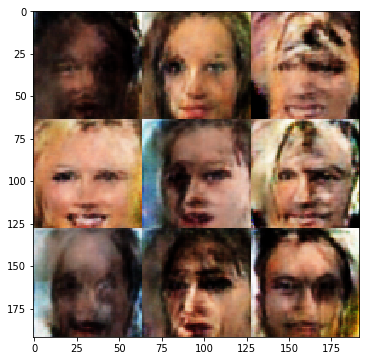

Epoch 2/10... Discr. Loss: 1.0699... Generator Loss: 1.8071
Epoch 2/10... Discr. Loss: 1.3764... Generator Loss: 0.6018
Epoch 2/10... Discr. Loss: 1.0633... Generator Loss: 1.1458
Epoch 2/10... Discr. Loss: 0.9268... Generator Loss: 1.4082
Epoch 2/10... Discr. Loss: 1.0174... Generator Loss: 1.2281
Epoch 2/10... Discr. Loss: 1.0603... Generator Loss: 1.5633
Epoch 2/10... Discr. Loss: 1.4328... Generator Loss: 0.6916
Epoch 2/10... Discr. Loss: 1.0557... Generator Loss: 1.3700
Epoch 2/10... Discr. Loss: 1.0426... Generator Loss: 1.2431
Epoch 2/10... Discr. Loss: 0.9843... Generator Loss: 1.4172
Epoch 2/10... Discr. Loss: 0.9596... Generator Loss: 1.4099
Epoch 2/10... Discr. Loss: 1.4064... Generator Loss: 0.6988
Epoch 2/10... Discr. Loss: 0.9413... Generator Loss: 1.4231
Epoch 2/10... Discr. Loss: 1.0169... Generator Loss: 1.2765
Epoch 2/10... Discr. Loss: 1.0001... Generator Loss: 1.2517
Epoch 2/10... Discr. Loss: 0.9192... Generator Loss: 1.3469
Epoch 2/10... Discr. Loss: 1.3196... Gen

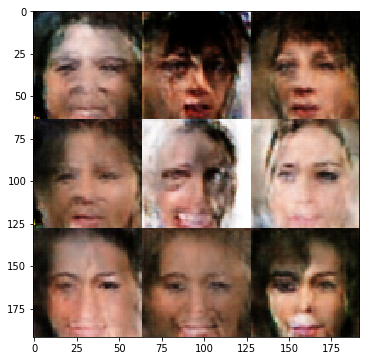

Epoch 2/10... Discr. Loss: 1.0958... Generator Loss: 1.4453
Epoch 2/10... Discr. Loss: 0.9739... Generator Loss: 1.3889
Epoch 2/10... Discr. Loss: 0.9972... Generator Loss: 1.5423
Epoch 2/10... Discr. Loss: 1.0804... Generator Loss: 1.4681
Epoch 2/10... Discr. Loss: 1.1000... Generator Loss: 1.1877
Epoch 2/10... Discr. Loss: 1.0593... Generator Loss: 1.2022
Epoch 2/10... Discr. Loss: 1.0868... Generator Loss: 1.4669
Epoch 2/10... Discr. Loss: 1.0437... Generator Loss: 1.3197
Epoch 2/10... Discr. Loss: 1.1300... Generator Loss: 0.8547
Epoch 2/10... Discr. Loss: 1.1494... Generator Loss: 1.1467
Epoch 2/10... Discr. Loss: 0.9991... Generator Loss: 1.1806
Epoch 2/10... Discr. Loss: 0.9828... Generator Loss: 1.5882
Epoch 2/10... Discr. Loss: 1.1090... Generator Loss: 0.9433
Epoch 2/10... Discr. Loss: 0.9396... Generator Loss: 1.4149
Epoch 2/10... Discr. Loss: 1.1823... Generator Loss: 1.2457
Epoch 2/10... Discr. Loss: 1.0605... Generator Loss: 1.3276
Epoch 2/10... Discr. Loss: 1.6814... Gen

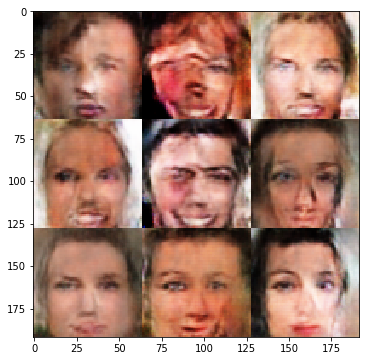

Epoch 2/10... Discr. Loss: 1.0939... Generator Loss: 0.9790
Epoch 2/10... Discr. Loss: 1.0099... Generator Loss: 1.5286
Epoch 2/10... Discr. Loss: 1.1043... Generator Loss: 0.9453
Epoch 2/10... Discr. Loss: 1.0412... Generator Loss: 1.2573
Epoch 2/10... Discr. Loss: 1.2019... Generator Loss: 1.4280
Epoch 2/10... Discr. Loss: 1.0698... Generator Loss: 1.0510
Epoch 2/10... Discr. Loss: 1.1131... Generator Loss: 1.0200
Epoch 2/10... Discr. Loss: 1.1805... Generator Loss: 0.7811
Epoch 2/10... Discr. Loss: 1.1540... Generator Loss: 1.2983
Epoch 2/10... Discr. Loss: 1.0711... Generator Loss: 1.0939
Epoch 2/10... Discr. Loss: 0.9989... Generator Loss: 1.1889
Epoch 2/10... Discr. Loss: 1.2878... Generator Loss: 0.6602
Epoch 2/10... Discr. Loss: 0.9733... Generator Loss: 1.2181
Epoch 2/10... Discr. Loss: 1.0545... Generator Loss: 1.5695
Epoch 2/10... Discr. Loss: 1.1922... Generator Loss: 1.5268
Epoch 2/10... Discr. Loss: 0.9966... Generator Loss: 1.2759
Epoch 2/10... Discr. Loss: 0.9960... Gen

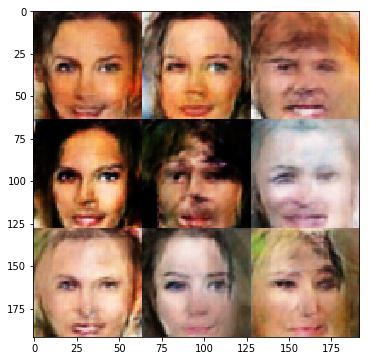

Epoch 2/10... Discr. Loss: 1.3013... Generator Loss: 1.2977
Epoch 2/10... Discr. Loss: 1.1322... Generator Loss: 0.9120
Epoch 2/10... Discr. Loss: 1.0402... Generator Loss: 1.2361
Epoch 2/10... Discr. Loss: 1.0842... Generator Loss: 1.3647
Epoch 2/10... Discr. Loss: 1.2279... Generator Loss: 0.7891
Epoch 2/10... Discr. Loss: 1.4619... Generator Loss: 2.0156
Epoch 2/10... Discr. Loss: 1.0573... Generator Loss: 1.2643
Epoch 2/10... Discr. Loss: 0.8905... Generator Loss: 1.7902
Epoch 2/10... Discr. Loss: 1.1002... Generator Loss: 1.1965
Epoch 2/10... Discr. Loss: 0.9738... Generator Loss: 1.1846
Epoch 2/10... Discr. Loss: 1.2896... Generator Loss: 1.7492
Epoch 2/10... Discr. Loss: 1.0198... Generator Loss: 1.2010
Epoch 2/10... Discr. Loss: 1.0547... Generator Loss: 1.1503
Epoch 2/10... Discr. Loss: 1.0253... Generator Loss: 1.2203
Epoch 2/10... Discr. Loss: 0.9837... Generator Loss: 1.4922
Epoch 2/10... Discr. Loss: 1.1007... Generator Loss: 1.2643
Epoch 2/10... Discr. Loss: 1.1455... Gen

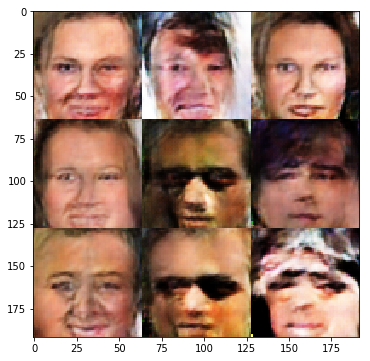

Epoch 2/10... Discr. Loss: 1.3167... Generator Loss: 0.7860
Epoch 2/10... Discr. Loss: 1.0102... Generator Loss: 1.2755
Epoch 2/10... Discr. Loss: 1.0442... Generator Loss: 1.1508
Epoch 2/10... Discr. Loss: 1.3868... Generator Loss: 0.6928
Epoch 2/10... Discr. Loss: 1.0941... Generator Loss: 1.2087
Epoch 2/10... Discr. Loss: 1.1219... Generator Loss: 1.0960
Epoch 2/10... Discr. Loss: 1.0909... Generator Loss: 1.2386
Epoch 2/10... Discr. Loss: 1.1084... Generator Loss: 0.9473
Epoch 2/10... Discr. Loss: 1.0328... Generator Loss: 1.2489
Epoch 2/10... Discr. Loss: 1.0114... Generator Loss: 1.1230
Epoch 2/10... Discr. Loss: 1.2011... Generator Loss: 0.9603
Epoch 2/10... Discr. Loss: 1.1572... Generator Loss: 0.7946
Epoch 2/10... Discr. Loss: 1.0769... Generator Loss: 1.1456
Epoch 2/10... Discr. Loss: 1.1057... Generator Loss: 1.1706
Epoch 2/10... Discr. Loss: 1.1010... Generator Loss: 1.0244
Epoch 2/10... Discr. Loss: 1.0218... Generator Loss: 1.2816
Epoch 3/10... Discr. Loss: 1.1154... Gen

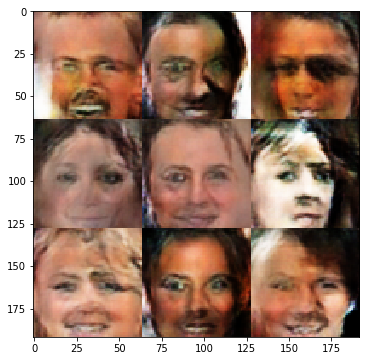

Epoch 3/10... Discr. Loss: 1.4685... Generator Loss: 1.9917
Epoch 3/10... Discr. Loss: 1.0798... Generator Loss: 1.0437
Epoch 3/10... Discr. Loss: 1.0714... Generator Loss: 1.3425
Epoch 3/10... Discr. Loss: 1.0411... Generator Loss: 1.2276
Epoch 3/10... Discr. Loss: 1.0273... Generator Loss: 1.0694
Epoch 3/10... Discr. Loss: 1.6931... Generator Loss: 1.6102
Epoch 3/10... Discr. Loss: 1.0974... Generator Loss: 1.2745
Epoch 3/10... Discr. Loss: 1.0417... Generator Loss: 1.1351
Epoch 3/10... Discr. Loss: 1.0575... Generator Loss: 1.1872
Epoch 3/10... Discr. Loss: 1.0597... Generator Loss: 1.2521
Epoch 3/10... Discr. Loss: 1.0468... Generator Loss: 1.4538
Epoch 3/10... Discr. Loss: 1.2195... Generator Loss: 0.9019
Epoch 3/10... Discr. Loss: 1.1104... Generator Loss: 1.3688
Epoch 3/10... Discr. Loss: 1.1080... Generator Loss: 1.3268
Epoch 3/10... Discr. Loss: 1.0539... Generator Loss: 0.9927
Epoch 3/10... Discr. Loss: 1.0432... Generator Loss: 1.3009
Epoch 3/10... Discr. Loss: 1.1564... Gen

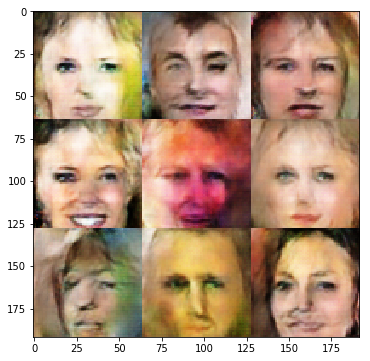

Epoch 3/10... Discr. Loss: 1.3119... Generator Loss: 1.0187
Epoch 3/10... Discr. Loss: 1.1114... Generator Loss: 1.0031
Epoch 3/10... Discr. Loss: 1.0756... Generator Loss: 1.2065
Epoch 3/10... Discr. Loss: 1.0948... Generator Loss: 1.1589
Epoch 3/10... Discr. Loss: 1.1203... Generator Loss: 1.0253
Epoch 3/10... Discr. Loss: 1.1275... Generator Loss: 1.1102
Epoch 3/10... Discr. Loss: 1.0944... Generator Loss: 1.4347
Epoch 3/10... Discr. Loss: 1.1218... Generator Loss: 1.0986
Epoch 3/10... Discr. Loss: 1.1602... Generator Loss: 1.1476
Epoch 3/10... Discr. Loss: 1.0710... Generator Loss: 1.1726
Epoch 3/10... Discr. Loss: 1.0838... Generator Loss: 0.9868
Epoch 3/10... Discr. Loss: 1.1322... Generator Loss: 1.4557
Epoch 3/10... Discr. Loss: 1.0877... Generator Loss: 1.1393
Epoch 3/10... Discr. Loss: 1.1329... Generator Loss: 1.0896
Epoch 3/10... Discr. Loss: 1.3641... Generator Loss: 0.6353
Epoch 3/10... Discr. Loss: 1.3891... Generator Loss: 1.7166
Epoch 3/10... Discr. Loss: 0.9974... Gen

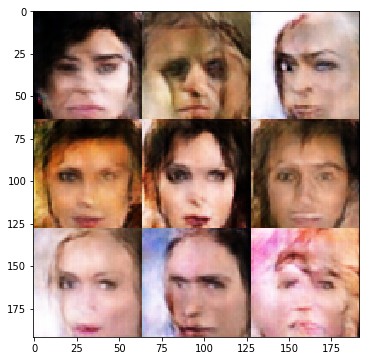

Epoch 3/10... Discr. Loss: 1.0941... Generator Loss: 1.1225
Epoch 3/10... Discr. Loss: 0.9940... Generator Loss: 1.1304
Epoch 3/10... Discr. Loss: 1.1283... Generator Loss: 1.1204
Epoch 3/10... Discr. Loss: 1.0345... Generator Loss: 1.2758
Epoch 3/10... Discr. Loss: 1.0745... Generator Loss: 1.5412
Epoch 3/10... Discr. Loss: 1.3841... Generator Loss: 1.6252
Epoch 3/10... Discr. Loss: 1.0493... Generator Loss: 1.3006
Epoch 3/10... Discr. Loss: 1.0691... Generator Loss: 1.6000
Epoch 3/10... Discr. Loss: 1.0550... Generator Loss: 1.3187
Epoch 3/10... Discr. Loss: 1.0906... Generator Loss: 1.2478
Epoch 3/10... Discr. Loss: 1.1714... Generator Loss: 1.6111
Epoch 3/10... Discr. Loss: 1.1672... Generator Loss: 1.0348
Epoch 3/10... Discr. Loss: 1.1143... Generator Loss: 1.1661
Epoch 3/10... Discr. Loss: 1.1792... Generator Loss: 1.2462
Epoch 3/10... Discr. Loss: 0.9725... Generator Loss: 1.4974
Epoch 3/10... Discr. Loss: 1.1163... Generator Loss: 1.1242
Epoch 3/10... Discr. Loss: 1.1779... Gen

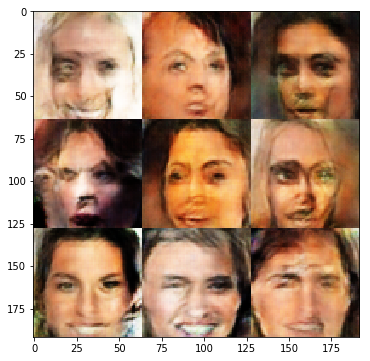

Epoch 3/10... Discr. Loss: 1.0482... Generator Loss: 1.1562
Epoch 3/10... Discr. Loss: 1.0882... Generator Loss: 1.3014
Epoch 3/10... Discr. Loss: 1.1602... Generator Loss: 1.2710
Epoch 3/10... Discr. Loss: 1.0170... Generator Loss: 1.3030
Epoch 3/10... Discr. Loss: 1.0709... Generator Loss: 1.1086
Epoch 3/10... Discr. Loss: 1.3246... Generator Loss: 2.0570
Epoch 3/10... Discr. Loss: 1.1178... Generator Loss: 1.6273
Epoch 3/10... Discr. Loss: 1.0552... Generator Loss: 1.0206
Epoch 3/10... Discr. Loss: 1.0375... Generator Loss: 1.1320
Epoch 3/10... Discr. Loss: 1.0799... Generator Loss: 1.2090
Epoch 3/10... Discr. Loss: 1.8858... Generator Loss: 2.5828
Epoch 3/10... Discr. Loss: 1.5003... Generator Loss: 0.7486
Epoch 3/10... Discr. Loss: 1.0984... Generator Loss: 1.4646
Epoch 3/10... Discr. Loss: 1.0353... Generator Loss: 1.2704
Epoch 3/10... Discr. Loss: 1.6431... Generator Loss: 0.4208
Epoch 3/10... Discr. Loss: 1.3359... Generator Loss: 0.9446
Epoch 3/10... Discr. Loss: 1.0773... Gen

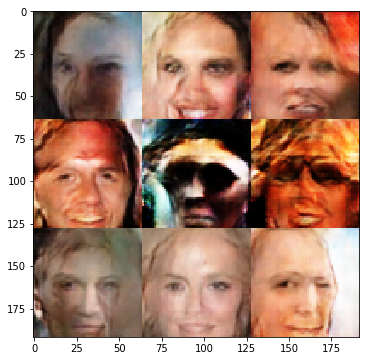

Epoch 3/10... Discr. Loss: 1.0717... Generator Loss: 1.3974
Epoch 3/10... Discr. Loss: 1.2116... Generator Loss: 0.7619
Epoch 3/10... Discr. Loss: 1.0436... Generator Loss: 1.1052
Epoch 3/10... Discr. Loss: 1.1558... Generator Loss: 0.9710
Epoch 3/10... Discr. Loss: 1.1304... Generator Loss: 1.3809
Epoch 3/10... Discr. Loss: 1.1489... Generator Loss: 1.3082
Epoch 3/10... Discr. Loss: 1.1641... Generator Loss: 0.7506
Epoch 3/10... Discr. Loss: 1.3104... Generator Loss: 0.6450
Epoch 3/10... Discr. Loss: 1.1068... Generator Loss: 1.0015
Epoch 3/10... Discr. Loss: 1.1174... Generator Loss: 1.4284
Epoch 3/10... Discr. Loss: 1.1687... Generator Loss: 0.9256
Epoch 3/10... Discr. Loss: 1.2128... Generator Loss: 1.6222
Epoch 3/10... Discr. Loss: 1.1393... Generator Loss: 0.9044
Epoch 3/10... Discr. Loss: 1.0032... Generator Loss: 1.1036
Epoch 3/10... Discr. Loss: 1.0183... Generator Loss: 1.3280
Epoch 3/10... Discr. Loss: 1.0879... Generator Loss: 1.3841
Epoch 3/10... Discr. Loss: 1.7762... Gen

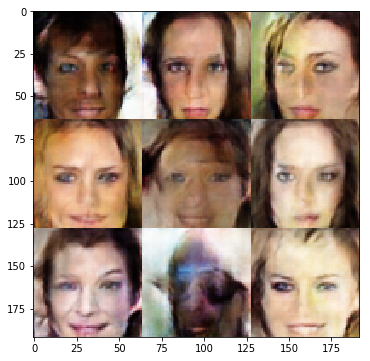

Epoch 3/10... Discr. Loss: 1.0044... Generator Loss: 1.0762
Epoch 3/10... Discr. Loss: 1.0728... Generator Loss: 1.1566
Epoch 3/10... Discr. Loss: 1.0829... Generator Loss: 1.6646
Epoch 3/10... Discr. Loss: 1.0879... Generator Loss: 1.3984
Epoch 3/10... Discr. Loss: 1.0987... Generator Loss: 1.1249
Epoch 3/10... Discr. Loss: 0.9880... Generator Loss: 1.3113
Epoch 3/10... Discr. Loss: 1.1855... Generator Loss: 0.9441
Epoch 3/10... Discr. Loss: 1.1285... Generator Loss: 1.2437
Epoch 3/10... Discr. Loss: 1.0838... Generator Loss: 1.1229
Epoch 3/10... Discr. Loss: 1.1136... Generator Loss: 1.0804
Epoch 3/10... Discr. Loss: 1.1143... Generator Loss: 1.1989
Epoch 3/10... Discr. Loss: 1.1432... Generator Loss: 1.4285
Epoch 3/10... Discr. Loss: 0.9627... Generator Loss: 1.6460
Epoch 3/10... Discr. Loss: 1.1604... Generator Loss: 1.0655
Epoch 3/10... Discr. Loss: 1.0560... Generator Loss: 1.2681
Epoch 3/10... Discr. Loss: 1.2004... Generator Loss: 1.3957
Epoch 3/10... Discr. Loss: 1.0689... Gen

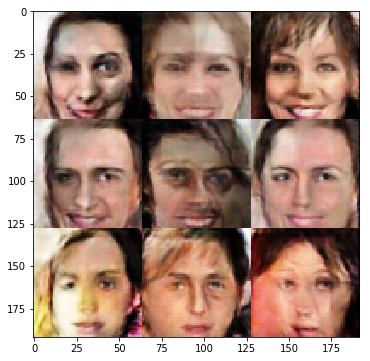

Epoch 3/10... Discr. Loss: 1.0862... Generator Loss: 1.3251
Epoch 3/10... Discr. Loss: 1.0127... Generator Loss: 1.3446
Epoch 3/10... Discr. Loss: 1.0216... Generator Loss: 1.0049
Epoch 3/10... Discr. Loss: 1.1017... Generator Loss: 1.1662
Epoch 3/10... Discr. Loss: 1.0287... Generator Loss: 1.1399
Epoch 3/10... Discr. Loss: 1.1062... Generator Loss: 0.8949
Epoch 3/10... Discr. Loss: 1.3504... Generator Loss: 1.2473
Epoch 3/10... Discr. Loss: 1.4898... Generator Loss: 1.6022
Epoch 3/10... Discr. Loss: 1.1562... Generator Loss: 0.9791
Epoch 3/10... Discr. Loss: 1.2231... Generator Loss: 0.9060
Epoch 3/10... Discr. Loss: 1.0950... Generator Loss: 1.1262
Epoch 3/10... Discr. Loss: 1.0995... Generator Loss: 1.0963
Epoch 3/10... Discr. Loss: 1.0712... Generator Loss: 1.0957
Epoch 3/10... Discr. Loss: 1.1131... Generator Loss: 1.6955
Epoch 3/10... Discr. Loss: 1.0732... Generator Loss: 1.3612
Epoch 3/10... Discr. Loss: 1.1039... Generator Loss: 1.4555
Epoch 3/10... Discr. Loss: 1.0072... Gen

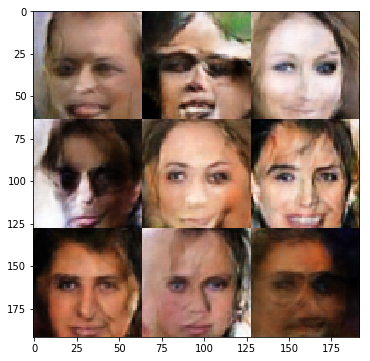

Epoch 3/10... Discr. Loss: 1.0355... Generator Loss: 0.9905
Epoch 3/10... Discr. Loss: 1.0798... Generator Loss: 0.9369
Epoch 3/10... Discr. Loss: 1.1496... Generator Loss: 1.6566
Epoch 3/10... Discr. Loss: 1.1464... Generator Loss: 1.5069
Epoch 3/10... Discr. Loss: 1.0591... Generator Loss: 1.0164
Epoch 3/10... Discr. Loss: 1.0760... Generator Loss: 0.8748
Epoch 3/10... Discr. Loss: 1.1248... Generator Loss: 0.9912
Epoch 3/10... Discr. Loss: 1.0515... Generator Loss: 1.1659
Epoch 3/10... Discr. Loss: 1.4633... Generator Loss: 0.5639
Epoch 3/10... Discr. Loss: 1.1498... Generator Loss: 1.1419
Epoch 3/10... Discr. Loss: 1.0009... Generator Loss: 1.2762
Epoch 3/10... Discr. Loss: 1.1555... Generator Loss: 0.9644
Epoch 3/10... Discr. Loss: 1.1110... Generator Loss: 1.1552
Epoch 3/10... Discr. Loss: 1.0907... Generator Loss: 0.8567
Epoch 4/10... Discr. Loss: 1.0220... Generator Loss: 1.3098
Epoch 4/10... Discr. Loss: 1.0748... Generator Loss: 0.9294
Epoch 4/10... Discr. Loss: 1.0110... Gen

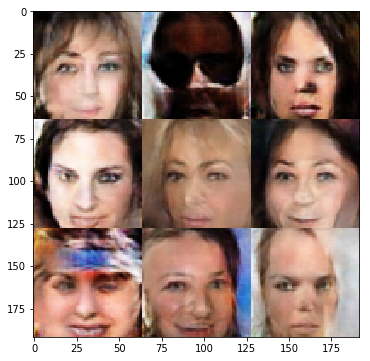

Epoch 4/10... Discr. Loss: 1.0203... Generator Loss: 1.3054
Epoch 4/10... Discr. Loss: 1.0497... Generator Loss: 1.1551
Epoch 4/10... Discr. Loss: 1.5209... Generator Loss: 0.4759
Epoch 4/10... Discr. Loss: 1.4730... Generator Loss: 0.6223
Epoch 4/10... Discr. Loss: 1.1141... Generator Loss: 1.1594
Epoch 4/10... Discr. Loss: 1.0932... Generator Loss: 1.1881
Epoch 4/10... Discr. Loss: 1.1508... Generator Loss: 1.2708
Epoch 4/10... Discr. Loss: 1.1532... Generator Loss: 0.8232
Epoch 4/10... Discr. Loss: 1.1586... Generator Loss: 1.1983
Epoch 4/10... Discr. Loss: 1.1178... Generator Loss: 0.9116
Epoch 4/10... Discr. Loss: 1.0671... Generator Loss: 1.0599
Epoch 4/10... Discr. Loss: 1.0463... Generator Loss: 1.1443
Epoch 4/10... Discr. Loss: 1.2540... Generator Loss: 1.6971
Epoch 4/10... Discr. Loss: 1.0826... Generator Loss: 1.2147
Epoch 4/10... Discr. Loss: 1.1233... Generator Loss: 1.3593
Epoch 4/10... Discr. Loss: 1.1378... Generator Loss: 1.1224
Epoch 4/10... Discr. Loss: 1.2550... Gen

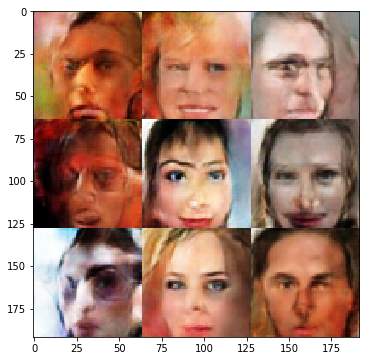

Epoch 4/10... Discr. Loss: 1.0162... Generator Loss: 1.4490
Epoch 4/10... Discr. Loss: 1.0772... Generator Loss: 1.0503
Epoch 4/10... Discr. Loss: 1.3369... Generator Loss: 0.6466
Epoch 4/10... Discr. Loss: 1.2048... Generator Loss: 1.1213
Epoch 4/10... Discr. Loss: 1.1971... Generator Loss: 1.0471
Epoch 4/10... Discr. Loss: 1.0338... Generator Loss: 1.2012
Epoch 4/10... Discr. Loss: 0.9739... Generator Loss: 1.2224
Epoch 4/10... Discr. Loss: 1.1676... Generator Loss: 0.9791
Epoch 4/10... Discr. Loss: 1.1857... Generator Loss: 0.9488
Epoch 4/10... Discr. Loss: 0.9897... Generator Loss: 1.3141
Epoch 4/10... Discr. Loss: 1.0332... Generator Loss: 1.0865
Epoch 4/10... Discr. Loss: 1.0821... Generator Loss: 0.8873
Epoch 4/10... Discr. Loss: 1.0159... Generator Loss: 1.2412
Epoch 4/10... Discr. Loss: 1.1533... Generator Loss: 1.0528
Epoch 4/10... Discr. Loss: 1.1122... Generator Loss: 1.4079
Epoch 4/10... Discr. Loss: 1.3492... Generator Loss: 0.6794
Epoch 4/10... Discr. Loss: 1.1693... Gen

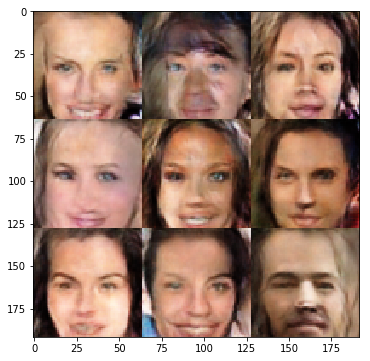

Epoch 4/10... Discr. Loss: 1.0474... Generator Loss: 1.0099
Epoch 4/10... Discr. Loss: 1.1054... Generator Loss: 1.3198
Epoch 4/10... Discr. Loss: 1.4014... Generator Loss: 1.9330
Epoch 4/10... Discr. Loss: 1.0897... Generator Loss: 1.3082
Epoch 4/10... Discr. Loss: 1.0915... Generator Loss: 1.2146
Epoch 4/10... Discr. Loss: 1.1799... Generator Loss: 1.0001
Epoch 4/10... Discr. Loss: 1.1230... Generator Loss: 1.6874
Epoch 4/10... Discr. Loss: 1.0301... Generator Loss: 1.2640
Epoch 4/10... Discr. Loss: 1.2233... Generator Loss: 1.5598
Epoch 4/10... Discr. Loss: 1.1042... Generator Loss: 1.1433
Epoch 4/10... Discr. Loss: 1.0396... Generator Loss: 1.0995
Epoch 4/10... Discr. Loss: 1.0876... Generator Loss: 1.1504
Epoch 4/10... Discr. Loss: 1.2510... Generator Loss: 1.6196
Epoch 4/10... Discr. Loss: 1.1315... Generator Loss: 1.0253
Epoch 4/10... Discr. Loss: 1.0782... Generator Loss: 1.2049
Epoch 4/10... Discr. Loss: 1.2114... Generator Loss: 1.2241
Epoch 4/10... Discr. Loss: 1.0594... Gen

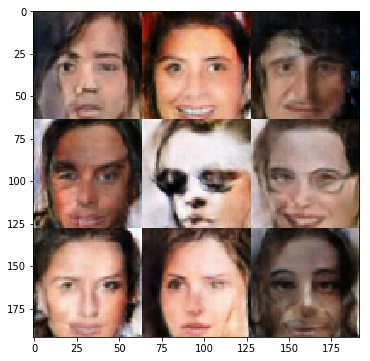

Epoch 4/10... Discr. Loss: 1.0872... Generator Loss: 0.9511
Epoch 4/10... Discr. Loss: 1.0726... Generator Loss: 1.1544
Epoch 4/10... Discr. Loss: 0.9913... Generator Loss: 1.2220
Epoch 4/10... Discr. Loss: 1.0084... Generator Loss: 1.3425
Epoch 4/10... Discr. Loss: 1.1497... Generator Loss: 0.7741
Epoch 4/10... Discr. Loss: 1.0062... Generator Loss: 1.5341
Epoch 4/10... Discr. Loss: 1.1612... Generator Loss: 1.6849
Epoch 4/10... Discr. Loss: 1.0285... Generator Loss: 1.5691
Epoch 4/10... Discr. Loss: 1.1444... Generator Loss: 0.8355
Epoch 4/10... Discr. Loss: 1.0473... Generator Loss: 1.0404
Epoch 4/10... Discr. Loss: 0.9656... Generator Loss: 1.1217
Epoch 4/10... Discr. Loss: 1.0502... Generator Loss: 1.3748
Epoch 4/10... Discr. Loss: 1.2225... Generator Loss: 1.5031
Epoch 4/10... Discr. Loss: 0.9217... Generator Loss: 1.7223
Epoch 4/10... Discr. Loss: 0.9905... Generator Loss: 1.3322
Epoch 4/10... Discr. Loss: 1.7844... Generator Loss: 0.4045
Epoch 4/10... Discr. Loss: 1.1732... Gen

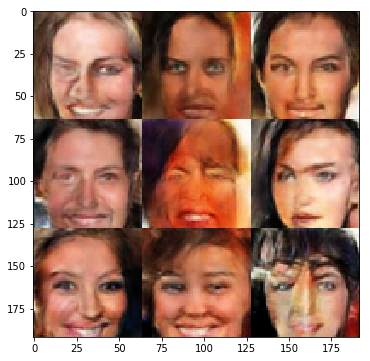

Epoch 4/10... Discr. Loss: 1.0810... Generator Loss: 1.2771
Epoch 4/10... Discr. Loss: 1.0361... Generator Loss: 1.1524
Epoch 4/10... Discr. Loss: 1.0532... Generator Loss: 1.3130
Epoch 4/10... Discr. Loss: 1.0903... Generator Loss: 1.0541
Epoch 4/10... Discr. Loss: 0.9763... Generator Loss: 1.3870
Epoch 4/10... Discr. Loss: 0.9041... Generator Loss: 1.2096
Epoch 4/10... Discr. Loss: 2.0045... Generator Loss: 0.3194
Epoch 4/10... Discr. Loss: 1.2013... Generator Loss: 0.8784
Epoch 4/10... Discr. Loss: 1.0994... Generator Loss: 1.0280
Epoch 4/10... Discr. Loss: 1.2637... Generator Loss: 0.7016
Epoch 4/10... Discr. Loss: 1.4606... Generator Loss: 0.9249
Epoch 4/10... Discr. Loss: 1.0713... Generator Loss: 1.1312
Epoch 4/10... Discr. Loss: 1.0389... Generator Loss: 1.0546
Epoch 4/10... Discr. Loss: 1.0402... Generator Loss: 1.1618
Epoch 4/10... Discr. Loss: 1.0618... Generator Loss: 1.0043
Epoch 4/10... Discr. Loss: 0.9525... Generator Loss: 1.4698
Epoch 4/10... Discr. Loss: 1.0190... Gen

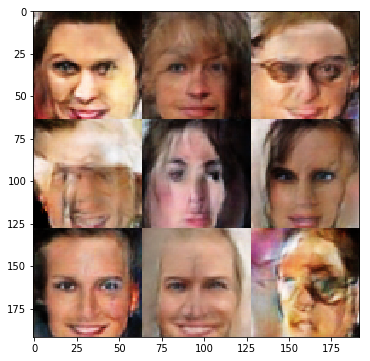

Epoch 4/10... Discr. Loss: 1.0344... Generator Loss: 1.3417
Epoch 4/10... Discr. Loss: 1.0379... Generator Loss: 1.5222
Epoch 4/10... Discr. Loss: 1.1338... Generator Loss: 1.6818
Epoch 4/10... Discr. Loss: 1.0868... Generator Loss: 1.4521
Epoch 4/10... Discr. Loss: 1.0524... Generator Loss: 1.1686
Epoch 4/10... Discr. Loss: 0.9534... Generator Loss: 1.2932
Epoch 4/10... Discr. Loss: 1.1752... Generator Loss: 0.7816
Epoch 4/10... Discr. Loss: 1.1797... Generator Loss: 2.1122
Epoch 4/10... Discr. Loss: 0.9795... Generator Loss: 1.1859
Epoch 4/10... Discr. Loss: 0.9888... Generator Loss: 1.3145
Epoch 4/10... Discr. Loss: 1.3765... Generator Loss: 0.5835
Epoch 4/10... Discr. Loss: 1.2173... Generator Loss: 0.9270
Epoch 4/10... Discr. Loss: 1.1448... Generator Loss: 0.9776
Epoch 4/10... Discr. Loss: 1.0069... Generator Loss: 1.5640
Epoch 4/10... Discr. Loss: 0.9981... Generator Loss: 1.0821
Epoch 4/10... Discr. Loss: 1.2257... Generator Loss: 0.7629
Epoch 4/10... Discr. Loss: 0.9340... Gen

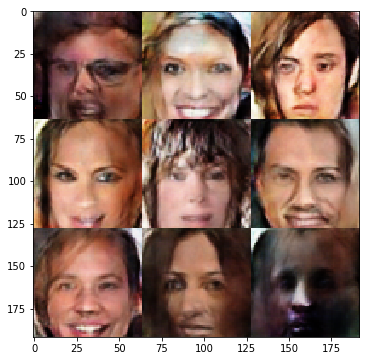

Epoch 4/10... Discr. Loss: 1.0083... Generator Loss: 1.0540
Epoch 4/10... Discr. Loss: 1.0797... Generator Loss: 0.8344
Epoch 4/10... Discr. Loss: 1.1376... Generator Loss: 0.8814
Epoch 4/10... Discr. Loss: 0.9473... Generator Loss: 1.3967
Epoch 4/10... Discr. Loss: 0.9349... Generator Loss: 1.5231
Epoch 4/10... Discr. Loss: 1.8667... Generator Loss: 1.0637
Epoch 4/10... Discr. Loss: 1.1355... Generator Loss: 1.4274
Epoch 4/10... Discr. Loss: 0.9219... Generator Loss: 1.4530
Epoch 4/10... Discr. Loss: 1.0528... Generator Loss: 1.0514
Epoch 4/10... Discr. Loss: 1.0252... Generator Loss: 1.0169
Epoch 4/10... Discr. Loss: 1.0403... Generator Loss: 1.1109
Epoch 4/10... Discr. Loss: 0.9921... Generator Loss: 1.1038
Epoch 4/10... Discr. Loss: 0.9689... Generator Loss: 1.7012
Epoch 4/10... Discr. Loss: 1.0789... Generator Loss: 0.8614
Epoch 4/10... Discr. Loss: 0.9794... Generator Loss: 1.3983
Epoch 4/10... Discr. Loss: 1.0168... Generator Loss: 1.2702
Epoch 4/10... Discr. Loss: 1.0383... Gen

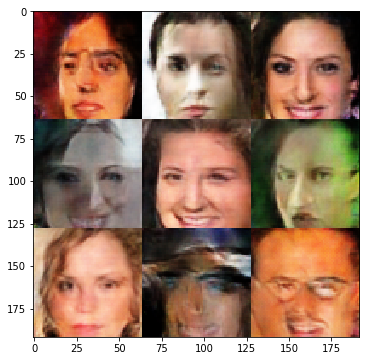

Epoch 4/10... Discr. Loss: 1.0345... Generator Loss: 1.5363
Epoch 4/10... Discr. Loss: 0.9820... Generator Loss: 1.4127
Epoch 4/10... Discr. Loss: 1.1982... Generator Loss: 0.8140
Epoch 4/10... Discr. Loss: 1.0029... Generator Loss: 1.2098
Epoch 4/10... Discr. Loss: 0.9978... Generator Loss: 1.1216
Epoch 4/10... Discr. Loss: 1.2839... Generator Loss: 2.0146
Epoch 4/10... Discr. Loss: 0.9650... Generator Loss: 1.3427
Epoch 4/10... Discr. Loss: 1.1171... Generator Loss: 1.3403
Epoch 4/10... Discr. Loss: 1.2169... Generator Loss: 2.2299
Epoch 4/10... Discr. Loss: 1.0238... Generator Loss: 1.0679
Epoch 4/10... Discr. Loss: 0.9685... Generator Loss: 1.5291
Epoch 4/10... Discr. Loss: 1.0222... Generator Loss: 1.0889
Epoch 5/10... Discr. Loss: 1.0135... Generator Loss: 1.1541
Epoch 5/10... Discr. Loss: 1.0014... Generator Loss: 1.5260
Epoch 5/10... Discr. Loss: 1.0809... Generator Loss: 1.6036
Epoch 5/10... Discr. Loss: 1.1077... Generator Loss: 1.3977
Epoch 5/10... Discr. Loss: 1.0099... Gen

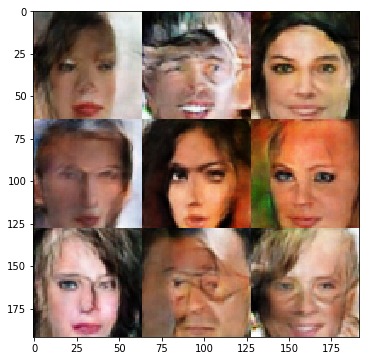

Epoch 5/10... Discr. Loss: 1.3157... Generator Loss: 0.6696
Epoch 5/10... Discr. Loss: 1.0546... Generator Loss: 1.0022
Epoch 5/10... Discr. Loss: 0.9574... Generator Loss: 1.7260
Epoch 5/10... Discr. Loss: 0.9442... Generator Loss: 1.3879
Epoch 5/10... Discr. Loss: 0.8965... Generator Loss: 1.5896
Epoch 5/10... Discr. Loss: 1.2038... Generator Loss: 1.7471
Epoch 5/10... Discr. Loss: 1.0538... Generator Loss: 0.9657
Epoch 5/10... Discr. Loss: 1.0161... Generator Loss: 1.1166
Epoch 5/10... Discr. Loss: 0.9427... Generator Loss: 1.3778
Epoch 5/10... Discr. Loss: 1.0035... Generator Loss: 1.1122
Epoch 5/10... Discr. Loss: 0.9439... Generator Loss: 1.3437
Epoch 5/10... Discr. Loss: 1.0502... Generator Loss: 1.0351
Epoch 5/10... Discr. Loss: 0.8984... Generator Loss: 1.4396
Epoch 5/10... Discr. Loss: 0.9876... Generator Loss: 1.7700
Epoch 5/10... Discr. Loss: 0.9956... Generator Loss: 1.4900
Epoch 5/10... Discr. Loss: 1.1834... Generator Loss: 2.0254
Epoch 5/10... Discr. Loss: 0.9269... Gen

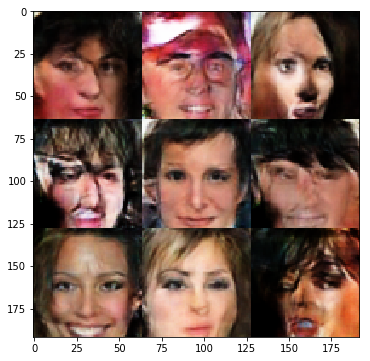

Epoch 5/10... Discr. Loss: 0.8379... Generator Loss: 1.4365
Epoch 5/10... Discr. Loss: 1.3779... Generator Loss: 0.5582
Epoch 5/10... Discr. Loss: 1.0866... Generator Loss: 1.4886
Epoch 5/10... Discr. Loss: 0.8881... Generator Loss: 1.2572
Epoch 5/10... Discr. Loss: 1.0890... Generator Loss: 1.9340
Epoch 5/10... Discr. Loss: 1.4059... Generator Loss: 0.8274
Epoch 5/10... Discr. Loss: 0.9926... Generator Loss: 1.1198
Epoch 5/10... Discr. Loss: 0.8765... Generator Loss: 1.2484
Epoch 5/10... Discr. Loss: 1.3033... Generator Loss: 2.3819
Epoch 5/10... Discr. Loss: 1.0298... Generator Loss: 1.3945
Epoch 5/10... Discr. Loss: 0.9431... Generator Loss: 1.3950
Epoch 5/10... Discr. Loss: 0.8890... Generator Loss: 1.2218
Epoch 5/10... Discr. Loss: 0.7615... Generator Loss: 1.4253
Epoch 5/10... Discr. Loss: 1.0307... Generator Loss: 1.8300
Epoch 5/10... Discr. Loss: 1.4320... Generator Loss: 0.6865
Epoch 5/10... Discr. Loss: 0.8239... Generator Loss: 1.6821
Epoch 5/10... Discr. Loss: 0.7925... Gen

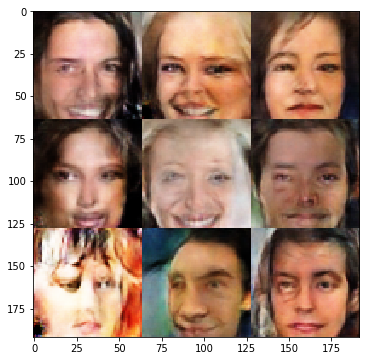

Epoch 5/10... Discr. Loss: 0.8341... Generator Loss: 1.3963
Epoch 5/10... Discr. Loss: 0.9231... Generator Loss: 1.8457
Epoch 5/10... Discr. Loss: 1.1308... Generator Loss: 1.2237
Epoch 5/10... Discr. Loss: 0.8412... Generator Loss: 1.3015
Epoch 5/10... Discr. Loss: 0.8699... Generator Loss: 1.7370
Epoch 5/10... Discr. Loss: 0.9566... Generator Loss: 1.3391
Epoch 5/10... Discr. Loss: 0.9338... Generator Loss: 1.3379
Epoch 5/10... Discr. Loss: 0.9712... Generator Loss: 0.9768
Epoch 5/10... Discr. Loss: 0.8642... Generator Loss: 1.4164
Epoch 5/10... Discr. Loss: 0.8706... Generator Loss: 1.3356
Epoch 5/10... Discr. Loss: 0.8136... Generator Loss: 1.3955
Epoch 5/10... Discr. Loss: 1.0016... Generator Loss: 1.9566
Epoch 5/10... Discr. Loss: 1.1367... Generator Loss: 2.1800
Epoch 5/10... Discr. Loss: 1.0479... Generator Loss: 1.3615
Epoch 5/10... Discr. Loss: 0.7593... Generator Loss: 1.7038
Epoch 5/10... Discr. Loss: 1.0296... Generator Loss: 0.9385
Epoch 5/10... Discr. Loss: 0.8012... Gen

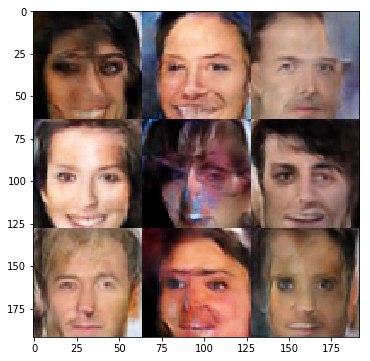

Epoch 5/10... Discr. Loss: 0.8852... Generator Loss: 1.6371
Epoch 5/10... Discr. Loss: 1.4112... Generator Loss: 0.6526
Epoch 5/10... Discr. Loss: 0.8948... Generator Loss: 1.2226
Epoch 5/10... Discr. Loss: 0.8217... Generator Loss: 1.4792
Epoch 5/10... Discr. Loss: 0.8191... Generator Loss: 1.6781
Epoch 5/10... Discr. Loss: 0.8106... Generator Loss: 2.1446
Epoch 5/10... Discr. Loss: 1.1497... Generator Loss: 2.1921
Epoch 5/10... Discr. Loss: 0.8471... Generator Loss: 1.4824
Epoch 5/10... Discr. Loss: 0.8408... Generator Loss: 1.5300
Epoch 5/10... Discr. Loss: 1.7106... Generator Loss: 2.7443
Epoch 5/10... Discr. Loss: 1.2481... Generator Loss: 1.3840
Epoch 5/10... Discr. Loss: 0.9986... Generator Loss: 1.6457
Epoch 5/10... Discr. Loss: 0.9718... Generator Loss: 1.0313
Epoch 5/10... Discr. Loss: 1.0428... Generator Loss: 1.0621
Epoch 5/10... Discr. Loss: 0.8553... Generator Loss: 1.4914
Epoch 5/10... Discr. Loss: 0.8184... Generator Loss: 1.6734
Epoch 5/10... Discr. Loss: 0.9390... Gen

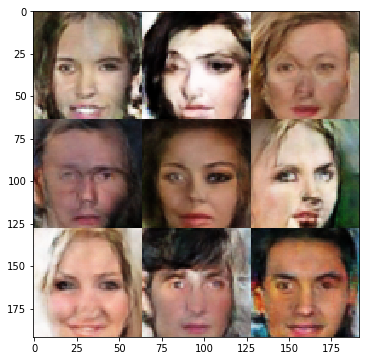

Epoch 5/10... Discr. Loss: 1.0064... Generator Loss: 2.1983
Epoch 5/10... Discr. Loss: 0.9164... Generator Loss: 1.2968
Epoch 5/10... Discr. Loss: 0.9335... Generator Loss: 1.3220
Epoch 5/10... Discr. Loss: 0.9001... Generator Loss: 1.3906
Epoch 5/10... Discr. Loss: 0.8191... Generator Loss: 1.3217
Epoch 5/10... Discr. Loss: 1.2461... Generator Loss: 1.1562
Epoch 5/10... Discr. Loss: 0.8451... Generator Loss: 1.5727
Epoch 5/10... Discr. Loss: 0.8915... Generator Loss: 1.8151
Epoch 5/10... Discr. Loss: 0.7797... Generator Loss: 1.5516
Epoch 5/10... Discr. Loss: 0.7566... Generator Loss: 2.1032
Epoch 5/10... Discr. Loss: 0.9286... Generator Loss: 1.0857
Epoch 5/10... Discr. Loss: 0.7382... Generator Loss: 1.5698
Epoch 5/10... Discr. Loss: 1.4383... Generator Loss: 0.5873
Epoch 5/10... Discr. Loss: 0.7776... Generator Loss: 2.0641
Epoch 5/10... Discr. Loss: 0.9310... Generator Loss: 2.1678
Epoch 5/10... Discr. Loss: 0.8564... Generator Loss: 1.3668
Epoch 5/10... Discr. Loss: 0.7297... Gen

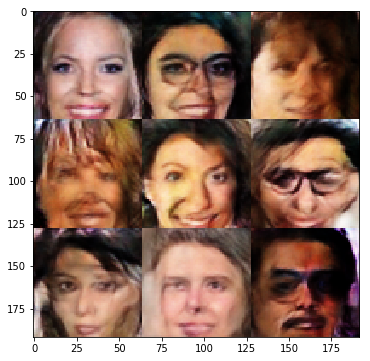

Epoch 5/10... Discr. Loss: 0.7750... Generator Loss: 2.0657
Epoch 5/10... Discr. Loss: 0.8500... Generator Loss: 1.4022
Epoch 5/10... Discr. Loss: 0.7938... Generator Loss: 1.4585
Epoch 5/10... Discr. Loss: 0.7552... Generator Loss: 1.6848
Epoch 5/10... Discr. Loss: 0.8842... Generator Loss: 1.3144
Epoch 5/10... Discr. Loss: 0.9394... Generator Loss: 1.7601
Epoch 5/10... Discr. Loss: 1.0298... Generator Loss: 1.0386
Epoch 5/10... Discr. Loss: 0.8938... Generator Loss: 1.3936
Epoch 5/10... Discr. Loss: 0.9015... Generator Loss: 2.5021
Epoch 5/10... Discr. Loss: 0.7848... Generator Loss: 1.7984
Epoch 5/10... Discr. Loss: 0.6770... Generator Loss: 1.8730
Epoch 5/10... Discr. Loss: 1.0483... Generator Loss: 1.0050
Epoch 5/10... Discr. Loss: 0.7340... Generator Loss: 2.0287
Epoch 5/10... Discr. Loss: 0.9502... Generator Loss: 2.0758
Epoch 5/10... Discr. Loss: 0.8343... Generator Loss: 1.2449
Epoch 5/10... Discr. Loss: 0.8286... Generator Loss: 1.3916
Epoch 5/10... Discr. Loss: 0.7781... Gen

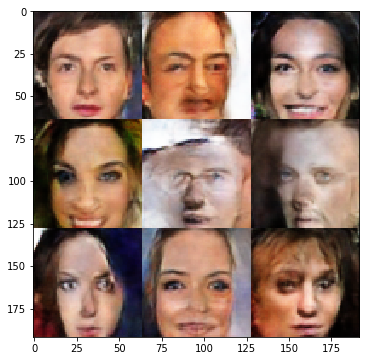

Epoch 5/10... Discr. Loss: 0.9236... Generator Loss: 1.0888
Epoch 5/10... Discr. Loss: 0.7500... Generator Loss: 1.5566
Epoch 5/10... Discr. Loss: 1.2334... Generator Loss: 3.2767
Epoch 5/10... Discr. Loss: 4.2869... Generator Loss: 2.6161
Epoch 5/10... Discr. Loss: 0.9592... Generator Loss: 1.1717
Epoch 5/10... Discr. Loss: 0.9438... Generator Loss: 2.1266
Epoch 5/10... Discr. Loss: 0.8036... Generator Loss: 1.4095
Epoch 5/10... Discr. Loss: 0.8028... Generator Loss: 2.1303
Epoch 5/10... Discr. Loss: 0.6755... Generator Loss: 1.9551
Epoch 5/10... Discr. Loss: 0.6944... Generator Loss: 1.6841
Epoch 5/10... Discr. Loss: 0.6898... Generator Loss: 1.7129
Epoch 5/10... Discr. Loss: 0.9248... Generator Loss: 1.8634
Epoch 5/10... Discr. Loss: 0.8470... Generator Loss: 1.9736
Epoch 5/10... Discr. Loss: 0.7432... Generator Loss: 1.5929
Epoch 5/10... Discr. Loss: 0.7045... Generator Loss: 1.8583
Epoch 5/10... Discr. Loss: 0.6442... Generator Loss: 2.0649
Epoch 5/10... Discr. Loss: 0.7059... Gen

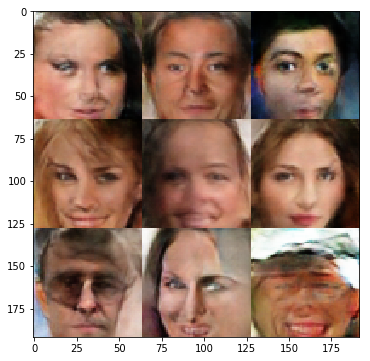

Epoch 5/10... Discr. Loss: 0.6922... Generator Loss: 1.6284
Epoch 5/10... Discr. Loss: 0.7360... Generator Loss: 1.8561
Epoch 5/10... Discr. Loss: 0.7670... Generator Loss: 1.4599
Epoch 5/10... Discr. Loss: 0.8099... Generator Loss: 2.1247
Epoch 5/10... Discr. Loss: 0.7563... Generator Loss: 1.7454
Epoch 5/10... Discr. Loss: 0.6648... Generator Loss: 1.7562
Epoch 5/10... Discr. Loss: 0.6793... Generator Loss: 2.1497
Epoch 5/10... Discr. Loss: 0.8278... Generator Loss: 2.8958
Epoch 5/10... Discr. Loss: 0.7798... Generator Loss: 1.4509
Epoch 5/10... Discr. Loss: 0.7736... Generator Loss: 1.4941
Epoch 5/10... Discr. Loss: 0.6520... Generator Loss: 1.9611
Epoch 6/10... Discr. Loss: 1.5104... Generator Loss: 1.4582
Epoch 6/10... Discr. Loss: 0.9376... Generator Loss: 2.2181
Epoch 6/10... Discr. Loss: 0.8091... Generator Loss: 1.4474
Epoch 6/10... Discr. Loss: 0.7121... Generator Loss: 2.1953
Epoch 6/10... Discr. Loss: 0.6578... Generator Loss: 1.9029
Epoch 6/10... Discr. Loss: 0.6717... Gen

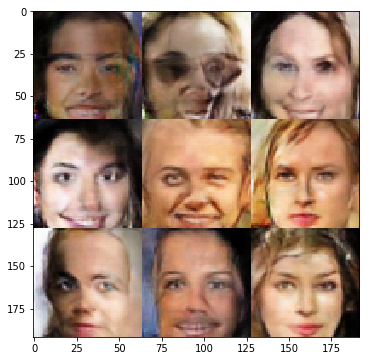

Epoch 6/10... Discr. Loss: 0.5645... Generator Loss: 2.2203
Epoch 6/10... Discr. Loss: 0.6323... Generator Loss: 2.2692
Epoch 6/10... Discr. Loss: 1.0721... Generator Loss: 0.8926
Epoch 6/10... Discr. Loss: 0.6393... Generator Loss: 2.1945
Epoch 6/10... Discr. Loss: 0.8197... Generator Loss: 1.2071
Epoch 6/10... Discr. Loss: 1.1800... Generator Loss: 0.8579
Epoch 6/10... Discr. Loss: 0.6596... Generator Loss: 1.9960
Epoch 6/10... Discr. Loss: 0.6915... Generator Loss: 2.1615
Epoch 6/10... Discr. Loss: 0.6802... Generator Loss: 1.6672
Epoch 6/10... Discr. Loss: 0.6624... Generator Loss: 1.7960
Epoch 6/10... Discr. Loss: 0.7078... Generator Loss: 1.8358
Epoch 6/10... Discr. Loss: 0.7001... Generator Loss: 2.8813
Epoch 6/10... Discr. Loss: 0.6437... Generator Loss: 1.5993
Epoch 6/10... Discr. Loss: 0.6707... Generator Loss: 2.1727
Epoch 6/10... Discr. Loss: 0.6788... Generator Loss: 1.9962
Epoch 6/10... Discr. Loss: 0.6040... Generator Loss: 2.1459
Epoch 6/10... Discr. Loss: 1.0826... Gen

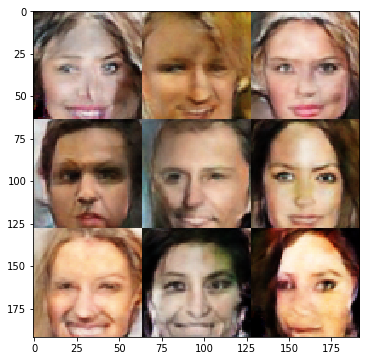

Epoch 6/10... Discr. Loss: 0.6618... Generator Loss: 1.8371
Epoch 6/10... Discr. Loss: 0.5651... Generator Loss: 2.6038
Epoch 6/10... Discr. Loss: 0.5641... Generator Loss: 2.1532
Epoch 6/10... Discr. Loss: 0.7099... Generator Loss: 2.9109
Epoch 6/10... Discr. Loss: 0.6316... Generator Loss: 2.1206
Epoch 6/10... Discr. Loss: 0.6701... Generator Loss: 1.6021
Epoch 6/10... Discr. Loss: 1.0254... Generator Loss: 1.1512
Epoch 6/10... Discr. Loss: 0.8649... Generator Loss: 1.8492
Epoch 6/10... Discr. Loss: 0.8394... Generator Loss: 1.3258
Epoch 6/10... Discr. Loss: 0.5823... Generator Loss: 2.3786
Epoch 6/10... Discr. Loss: 0.6512... Generator Loss: 1.8380
Epoch 6/10... Discr. Loss: 0.6389... Generator Loss: 2.0256
Epoch 6/10... Discr. Loss: 0.5944... Generator Loss: 2.5424
Epoch 6/10... Discr. Loss: 0.6251... Generator Loss: 1.6189
Epoch 6/10... Discr. Loss: 0.6436... Generator Loss: 2.4772
Epoch 6/10... Discr. Loss: 0.5672... Generator Loss: 2.2886
Epoch 6/10... Discr. Loss: 0.6306... Gen

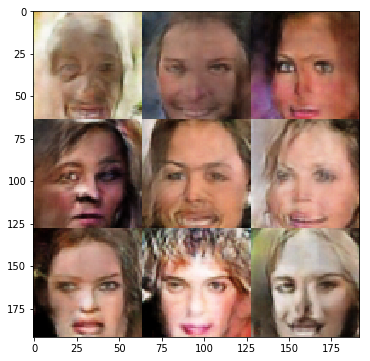

Epoch 6/10... Discr. Loss: 1.5706... Generator Loss: 0.8928
Epoch 6/10... Discr. Loss: 1.5836... Generator Loss: 1.0317
Epoch 6/10... Discr. Loss: 1.5875... Generator Loss: 0.9309
Epoch 6/10... Discr. Loss: 1.5364... Generator Loss: 0.9151
Epoch 6/10... Discr. Loss: 1.5696... Generator Loss: 0.8694
Epoch 6/10... Discr. Loss: 1.5189... Generator Loss: 0.9260
Epoch 6/10... Discr. Loss: 1.4686... Generator Loss: 0.8916
Epoch 6/10... Discr. Loss: 1.5554... Generator Loss: 0.8354
Epoch 6/10... Discr. Loss: 1.5422... Generator Loss: 0.8990
Epoch 6/10... Discr. Loss: 1.4927... Generator Loss: 0.9361
Epoch 6/10... Discr. Loss: 1.4201... Generator Loss: 0.8688
Epoch 6/10... Discr. Loss: 1.4774... Generator Loss: 1.1654
Epoch 6/10... Discr. Loss: 1.2998... Generator Loss: 1.1444
Epoch 6/10... Discr. Loss: 0.9981... Generator Loss: 1.2670
Epoch 6/10... Discr. Loss: 1.0002... Generator Loss: 1.2082
Epoch 6/10... Discr. Loss: 0.8087... Generator Loss: 1.5785
Epoch 6/10... Discr. Loss: 0.7289... Gen

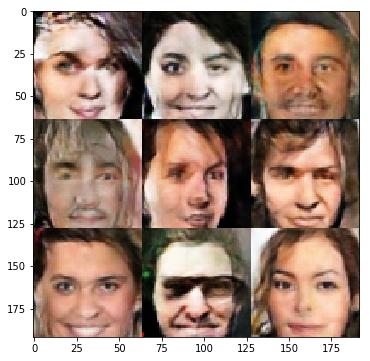

Epoch 6/10... Discr. Loss: 0.9621... Generator Loss: 1.0944
Epoch 6/10... Discr. Loss: 0.8101... Generator Loss: 1.8682
Epoch 6/10... Discr. Loss: 0.7176... Generator Loss: 2.5537
Epoch 6/10... Discr. Loss: 0.5951... Generator Loss: 2.2199
Epoch 6/10... Discr. Loss: 0.7393... Generator Loss: 2.4747
Epoch 6/10... Discr. Loss: 0.6411... Generator Loss: 1.6468
Epoch 6/10... Discr. Loss: 1.1904... Generator Loss: 0.9165
Epoch 6/10... Discr. Loss: 0.5949... Generator Loss: 2.2128
Epoch 6/10... Discr. Loss: 0.6157... Generator Loss: 1.9317
Epoch 6/10... Discr. Loss: 0.6543... Generator Loss: 2.1572
Epoch 6/10... Discr. Loss: 0.6451... Generator Loss: 1.8508
Epoch 6/10... Discr. Loss: 0.6548... Generator Loss: 1.6379
Epoch 6/10... Discr. Loss: 0.7829... Generator Loss: 2.4810
Epoch 6/10... Discr. Loss: 0.7147... Generator Loss: 2.0175
Epoch 6/10... Discr. Loss: 0.6751... Generator Loss: 2.7437
Epoch 6/10... Discr. Loss: 0.7236... Generator Loss: 1.4856
Epoch 6/10... Discr. Loss: 1.0095... Gen

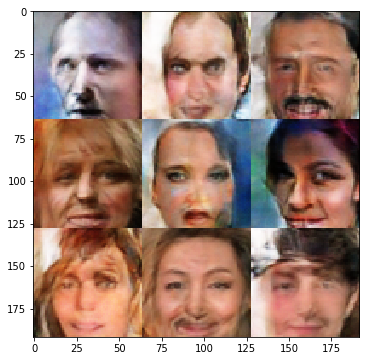

Epoch 6/10... Discr. Loss: 0.8373... Generator Loss: 1.3398
Epoch 6/10... Discr. Loss: 0.6537... Generator Loss: 2.1807
Epoch 6/10... Discr. Loss: 0.5703... Generator Loss: 2.4317
Epoch 6/10... Discr. Loss: 0.6168... Generator Loss: 1.8785
Epoch 6/10... Discr. Loss: 0.5866... Generator Loss: 2.3729
Epoch 6/10... Discr. Loss: 0.5396... Generator Loss: 2.2876
Epoch 6/10... Discr. Loss: 0.6750... Generator Loss: 2.0977
Epoch 6/10... Discr. Loss: 0.5484... Generator Loss: 2.6670
Epoch 6/10... Discr. Loss: 0.5434... Generator Loss: 2.4627
Epoch 6/10... Discr. Loss: 0.5831... Generator Loss: 2.0623
Epoch 6/10... Discr. Loss: 0.6327... Generator Loss: 2.1487
Epoch 6/10... Discr. Loss: 0.5611... Generator Loss: 2.7300
Epoch 6/10... Discr. Loss: 0.5142... Generator Loss: 2.2760
Epoch 6/10... Discr. Loss: 0.9891... Generator Loss: 1.1176
Epoch 6/10... Discr. Loss: 1.0756... Generator Loss: 1.5353
Epoch 6/10... Discr. Loss: 0.7973... Generator Loss: 1.4788
Epoch 6/10... Discr. Loss: 0.6106... Gen

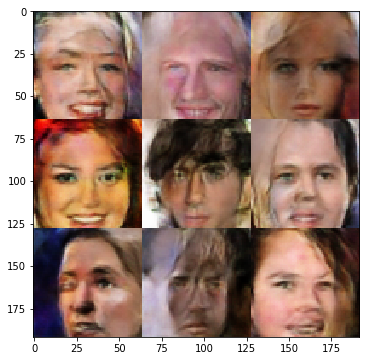

Epoch 6/10... Discr. Loss: 1.5767... Generator Loss: 3.9926
Epoch 6/10... Discr. Loss: 0.8523... Generator Loss: 1.3743
Epoch 6/10... Discr. Loss: 0.8702... Generator Loss: 3.7253
Epoch 6/10... Discr. Loss: 0.5810... Generator Loss: 2.3589
Epoch 6/10... Discr. Loss: 0.5563... Generator Loss: 2.1464
Epoch 6/10... Discr. Loss: 0.6060... Generator Loss: 2.3369
Epoch 6/10... Discr. Loss: 0.6934... Generator Loss: 1.5127
Epoch 6/10... Discr. Loss: 0.6029... Generator Loss: 2.6574
Epoch 6/10... Discr. Loss: 0.5262... Generator Loss: 2.6830
Epoch 6/10... Discr. Loss: 0.4297... Generator Loss: 2.6680
Epoch 6/10... Discr. Loss: 0.6752... Generator Loss: 2.9691
Epoch 6/10... Discr. Loss: 3.0928... Generator Loss: 3.9558
Epoch 6/10... Discr. Loss: 0.8523... Generator Loss: 1.4977
Epoch 6/10... Discr. Loss: 0.6725... Generator Loss: 1.7470
Epoch 6/10... Discr. Loss: 0.7051... Generator Loss: 1.9742
Epoch 6/10... Discr. Loss: 0.5174... Generator Loss: 2.1983
Epoch 6/10... Discr. Loss: 0.6150... Gen

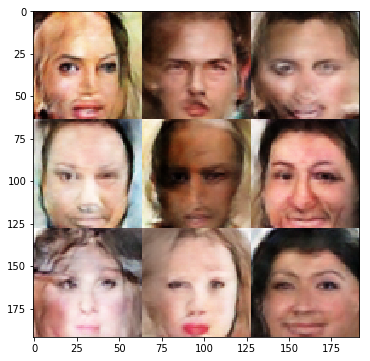

Epoch 6/10... Discr. Loss: 0.6253... Generator Loss: 3.0410
Epoch 6/10... Discr. Loss: 0.6006... Generator Loss: 1.9559
Epoch 6/10... Discr. Loss: 0.5454... Generator Loss: 3.0543
Epoch 6/10... Discr. Loss: 0.8160... Generator Loss: 1.3519
Epoch 6/10... Discr. Loss: 1.7595... Generator Loss: 2.4310
Epoch 6/10... Discr. Loss: 0.6644... Generator Loss: 2.5870
Epoch 6/10... Discr. Loss: 0.6354... Generator Loss: 2.0383
Epoch 6/10... Discr. Loss: 0.6492... Generator Loss: 1.3822
Epoch 6/10... Discr. Loss: 0.6202... Generator Loss: 2.1405
Epoch 6/10... Discr. Loss: 0.5443... Generator Loss: 2.3507
Epoch 6/10... Discr. Loss: 0.5759... Generator Loss: 2.6633
Epoch 6/10... Discr. Loss: 0.6006... Generator Loss: 3.0407
Epoch 6/10... Discr. Loss: 0.4494... Generator Loss: 2.9109
Epoch 6/10... Discr. Loss: 0.5032... Generator Loss: 2.1910
Epoch 6/10... Discr. Loss: 0.5572... Generator Loss: 2.6056
Epoch 6/10... Discr. Loss: 0.5082... Generator Loss: 2.4521
Epoch 6/10... Discr. Loss: 0.5399... Gen

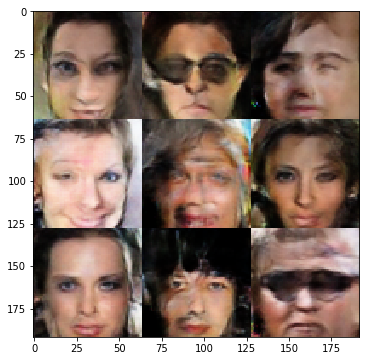

Epoch 6/10... Discr. Loss: 0.5556... Generator Loss: 2.3150
Epoch 6/10... Discr. Loss: 0.6357... Generator Loss: 2.7010
Epoch 6/10... Discr. Loss: 0.5345... Generator Loss: 2.2219
Epoch 6/10... Discr. Loss: 0.6075... Generator Loss: 2.2102
Epoch 6/10... Discr. Loss: 0.6316... Generator Loss: 1.6897
Epoch 6/10... Discr. Loss: 0.8918... Generator Loss: 3.3598
Epoch 6/10... Discr. Loss: 0.5654... Generator Loss: 2.4400
Epoch 6/10... Discr. Loss: 0.4892... Generator Loss: 2.8631
Epoch 6/10... Discr. Loss: 0.5121... Generator Loss: 2.5874
Epoch 7/10... Discr. Loss: 0.4965... Generator Loss: 2.1953
Epoch 7/10... Discr. Loss: 0.6247... Generator Loss: 3.0598
Epoch 7/10... Discr. Loss: 0.5742... Generator Loss: 2.0288
Epoch 7/10... Discr. Loss: 0.4810... Generator Loss: 2.4249
Epoch 7/10... Discr. Loss: 0.5493... Generator Loss: 2.9269
Epoch 7/10... Discr. Loss: 0.5633... Generator Loss: 2.4023
Epoch 7/10... Discr. Loss: 0.4780... Generator Loss: 2.1054
Epoch 7/10... Discr. Loss: 0.5937... Gen

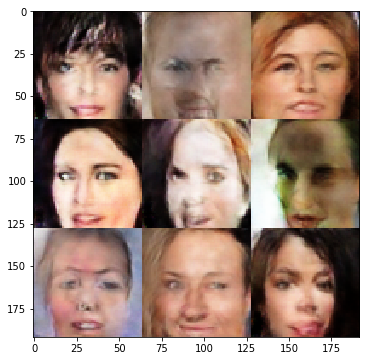

Epoch 7/10... Discr. Loss: 1.1506... Generator Loss: 2.4903
Epoch 7/10... Discr. Loss: 0.6458... Generator Loss: 2.6663
Epoch 7/10... Discr. Loss: 0.6073... Generator Loss: 2.6710
Epoch 7/10... Discr. Loss: 0.5291... Generator Loss: 2.3726
Epoch 7/10... Discr. Loss: 1.0050... Generator Loss: 1.0197
Epoch 7/10... Discr. Loss: 0.5761... Generator Loss: 2.3424
Epoch 7/10... Discr. Loss: 0.5796... Generator Loss: 2.0001
Epoch 7/10... Discr. Loss: 0.4609... Generator Loss: 2.5731
Epoch 7/10... Discr. Loss: 0.6400... Generator Loss: 1.7925
Epoch 7/10... Discr. Loss: 0.5381... Generator Loss: 2.4773
Epoch 7/10... Discr. Loss: 1.6873... Generator Loss: 3.1525
Epoch 7/10... Discr. Loss: 0.7194... Generator Loss: 1.8268
Epoch 7/10... Discr. Loss: 0.5961... Generator Loss: 2.0806
Epoch 7/10... Discr. Loss: 0.5814... Generator Loss: 2.1480
Epoch 7/10... Discr. Loss: 0.5410... Generator Loss: 2.7796
Epoch 7/10... Discr. Loss: 0.5547... Generator Loss: 2.0314
Epoch 7/10... Discr. Loss: 0.6985... Gen

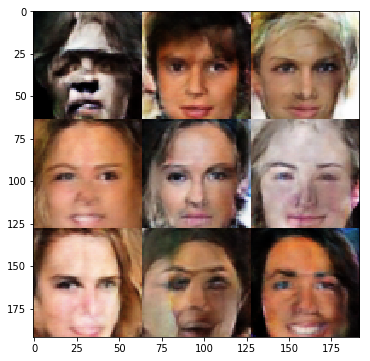

Epoch 7/10... Discr. Loss: 0.4342... Generator Loss: 2.9666
Epoch 7/10... Discr. Loss: 0.4332... Generator Loss: 2.6219
Epoch 7/10... Discr. Loss: 0.8343... Generator Loss: 1.3833
Epoch 7/10... Discr. Loss: 0.4947... Generator Loss: 2.6172
Epoch 7/10... Discr. Loss: 1.8413... Generator Loss: 4.8332
Epoch 7/10... Discr. Loss: 1.0323... Generator Loss: 1.1340
Epoch 7/10... Discr. Loss: 0.6754... Generator Loss: 2.3350
Epoch 7/10... Discr. Loss: 0.4581... Generator Loss: 2.6421
Epoch 7/10... Discr. Loss: 0.5177... Generator Loss: 2.9575
Epoch 7/10... Discr. Loss: 0.5055... Generator Loss: 2.0633
Epoch 7/10... Discr. Loss: 0.4735... Generator Loss: 2.7611
Epoch 7/10... Discr. Loss: 0.5071... Generator Loss: 2.2230
Epoch 7/10... Discr. Loss: 0.4832... Generator Loss: 3.5070
Epoch 7/10... Discr. Loss: 0.5416... Generator Loss: 3.0343
Epoch 7/10... Discr. Loss: 0.4330... Generator Loss: 2.7152
Epoch 7/10... Discr. Loss: 1.3510... Generator Loss: 0.7544
Epoch 7/10... Discr. Loss: 1.6831... Gen

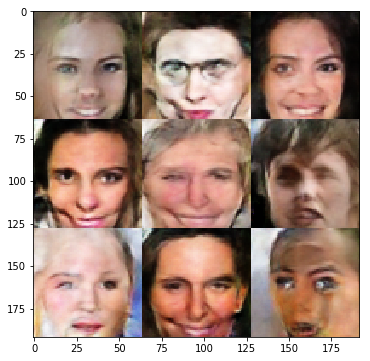

Epoch 7/10... Discr. Loss: 0.6890... Generator Loss: 3.1862
Epoch 7/10... Discr. Loss: 0.5414... Generator Loss: 2.1460
Epoch 7/10... Discr. Loss: 0.5686... Generator Loss: 2.0683
Epoch 7/10... Discr. Loss: 0.8558... Generator Loss: 1.2266
Epoch 7/10... Discr. Loss: 0.5585... Generator Loss: 2.1186
Epoch 7/10... Discr. Loss: 0.4775... Generator Loss: 3.0995
Epoch 7/10... Discr. Loss: 0.4643... Generator Loss: 2.6698
Epoch 7/10... Discr. Loss: 0.4824... Generator Loss: 2.7649
Epoch 7/10... Discr. Loss: 0.4106... Generator Loss: 3.1851
Epoch 7/10... Discr. Loss: 0.5936... Generator Loss: 1.7722
Epoch 7/10... Discr. Loss: 0.4489... Generator Loss: 2.5316
Epoch 7/10... Discr. Loss: 0.4699... Generator Loss: 2.3880
Epoch 7/10... Discr. Loss: 0.5689... Generator Loss: 3.2626
Epoch 7/10... Discr. Loss: 1.1630... Generator Loss: 1.1138
Epoch 7/10... Discr. Loss: 0.6925... Generator Loss: 2.4757
Epoch 7/10... Discr. Loss: 0.5432... Generator Loss: 2.5684
Epoch 7/10... Discr. Loss: 0.4702... Gen

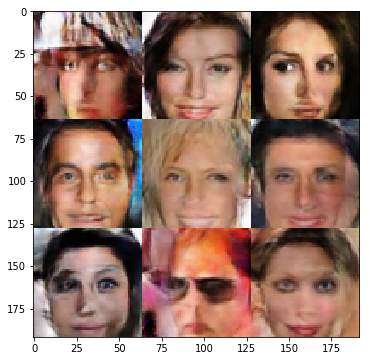

Epoch 7/10... Discr. Loss: 0.4504... Generator Loss: 2.5185
Epoch 7/10... Discr. Loss: 0.5865... Generator Loss: 1.8780
Epoch 7/10... Discr. Loss: 0.7075... Generator Loss: 3.1505
Epoch 7/10... Discr. Loss: 0.5232... Generator Loss: 2.3178
Epoch 7/10... Discr. Loss: 0.5539... Generator Loss: 3.7859
Epoch 7/10... Discr. Loss: 0.7101... Generator Loss: 3.3693
Epoch 7/10... Discr. Loss: 0.4626... Generator Loss: 2.5281
Epoch 7/10... Discr. Loss: 0.4208... Generator Loss: 2.9587
Epoch 7/10... Discr. Loss: 0.4609... Generator Loss: 2.7987
Epoch 7/10... Discr. Loss: 0.4779... Generator Loss: 2.3715
Epoch 7/10... Discr. Loss: 0.4583... Generator Loss: 3.6288
Epoch 7/10... Discr. Loss: 0.5488... Generator Loss: 2.0317
Epoch 7/10... Discr. Loss: 0.4942... Generator Loss: 2.9098
Epoch 7/10... Discr. Loss: 0.4030... Generator Loss: 3.1865
Epoch 7/10... Discr. Loss: 0.5595... Generator Loss: 3.5441
Epoch 7/10... Discr. Loss: 0.4950... Generator Loss: 2.9721
Epoch 7/10... Discr. Loss: 0.4925... Gen

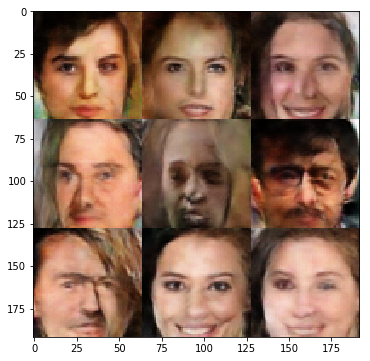

Epoch 7/10... Discr. Loss: 1.5741... Generator Loss: 0.9103
Epoch 7/10... Discr. Loss: 1.1039... Generator Loss: 1.2834
Epoch 7/10... Discr. Loss: 0.6754... Generator Loss: 2.1272
Epoch 7/10... Discr. Loss: 0.5842... Generator Loss: 2.6268
Epoch 7/10... Discr. Loss: 0.5383... Generator Loss: 2.4912
Epoch 7/10... Discr. Loss: 0.5373... Generator Loss: 2.7699
Epoch 7/10... Discr. Loss: 0.4892... Generator Loss: 2.8726
Epoch 7/10... Discr. Loss: 0.4693... Generator Loss: 2.4188
Epoch 7/10... Discr. Loss: 0.4956... Generator Loss: 3.0433
Epoch 7/10... Discr. Loss: 0.5131... Generator Loss: 2.5278
Epoch 7/10... Discr. Loss: 0.4260... Generator Loss: 2.8062
Epoch 7/10... Discr. Loss: 0.4889... Generator Loss: 2.3326
Epoch 7/10... Discr. Loss: 0.4203... Generator Loss: 3.0839
Epoch 7/10... Discr. Loss: 0.5165... Generator Loss: 2.6841
Epoch 7/10... Discr. Loss: 0.5558... Generator Loss: 3.0683
Epoch 7/10... Discr. Loss: 0.4793... Generator Loss: 2.2362
Epoch 7/10... Discr. Loss: 0.4514... Gen

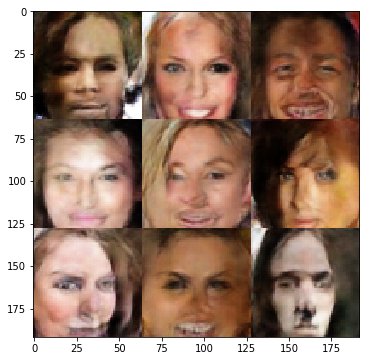

Epoch 7/10... Discr. Loss: 0.6710... Generator Loss: 2.3660
Epoch 7/10... Discr. Loss: 0.6379... Generator Loss: 1.8225
Epoch 7/10... Discr. Loss: 0.4799... Generator Loss: 2.6402
Epoch 7/10... Discr. Loss: 0.5025... Generator Loss: 2.3436
Epoch 7/10... Discr. Loss: 0.5921... Generator Loss: 3.5528
Epoch 7/10... Discr. Loss: 0.4777... Generator Loss: 3.6018
Epoch 7/10... Discr. Loss: 0.4378... Generator Loss: 2.5473
Epoch 7/10... Discr. Loss: 0.4704... Generator Loss: 2.7940
Epoch 7/10... Discr. Loss: 0.5218... Generator Loss: 2.7779
Epoch 7/10... Discr. Loss: 1.1055... Generator Loss: 0.9380
Epoch 7/10... Discr. Loss: 1.0735... Generator Loss: 2.7068
Epoch 7/10... Discr. Loss: 0.5138... Generator Loss: 2.7350
Epoch 7/10... Discr. Loss: 0.5196... Generator Loss: 2.6195
Epoch 7/10... Discr. Loss: 0.4658... Generator Loss: 2.5317
Epoch 7/10... Discr. Loss: 0.4550... Generator Loss: 3.3100
Epoch 7/10... Discr. Loss: 0.4432... Generator Loss: 2.8909
Epoch 7/10... Discr. Loss: 0.4703... Gen

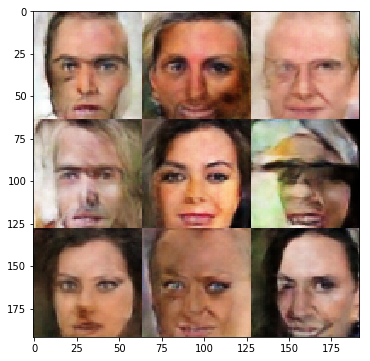

Epoch 7/10... Discr. Loss: 0.4888... Generator Loss: 3.0373
Epoch 7/10... Discr. Loss: 0.5481... Generator Loss: 2.2649
Epoch 7/10... Discr. Loss: 1.6173... Generator Loss: 0.5761
Epoch 7/10... Discr. Loss: 0.6245... Generator Loss: 2.8840
Epoch 7/10... Discr. Loss: 0.5497... Generator Loss: 2.5825
Epoch 7/10... Discr. Loss: 0.4260... Generator Loss: 3.1422
Epoch 7/10... Discr. Loss: 0.4671... Generator Loss: 2.9694
Epoch 7/10... Discr. Loss: 0.4349... Generator Loss: 2.7217
Epoch 7/10... Discr. Loss: 0.4552... Generator Loss: 2.6683
Epoch 7/10... Discr. Loss: 0.4304... Generator Loss: 2.5563
Epoch 7/10... Discr. Loss: 0.4807... Generator Loss: 2.4677
Epoch 7/10... Discr. Loss: 0.5314... Generator Loss: 2.0007
Epoch 7/10... Discr. Loss: 0.4686... Generator Loss: 2.3157
Epoch 7/10... Discr. Loss: 0.4508... Generator Loss: 3.2719
Epoch 7/10... Discr. Loss: 0.4068... Generator Loss: 3.0177
Epoch 7/10... Discr. Loss: 0.3854... Generator Loss: 3.4344
Epoch 7/10... Discr. Loss: 0.4399... Gen

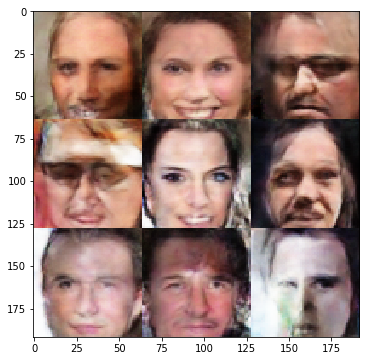

Epoch 7/10... Discr. Loss: 0.5427... Generator Loss: 2.4966
Epoch 7/10... Discr. Loss: 0.5080... Generator Loss: 2.9670
Epoch 7/10... Discr. Loss: 0.4853... Generator Loss: 3.1394
Epoch 7/10... Discr. Loss: 0.4486... Generator Loss: 3.6016
Epoch 7/10... Discr. Loss: 0.4563... Generator Loss: 3.2498
Epoch 7/10... Discr. Loss: 0.4720... Generator Loss: 2.2517
Epoch 7/10... Discr. Loss: 0.4970... Generator Loss: 2.5672
Epoch 8/10... Discr. Loss: 0.6223... Generator Loss: 3.5648
Epoch 8/10... Discr. Loss: 0.4076... Generator Loss: 3.0532
Epoch 8/10... Discr. Loss: 0.4129... Generator Loss: 2.8280
Epoch 8/10... Discr. Loss: 0.5751... Generator Loss: 2.0611
Epoch 8/10... Discr. Loss: 0.5172... Generator Loss: 3.1811
Epoch 8/10... Discr. Loss: 0.4167... Generator Loss: 2.8234
Epoch 8/10... Discr. Loss: 0.5738... Generator Loss: 2.5447
Epoch 8/10... Discr. Loss: 0.4474... Generator Loss: 3.2518
Epoch 8/10... Discr. Loss: 0.4479... Generator Loss: 2.4235
Epoch 8/10... Discr. Loss: 0.3839... Gen

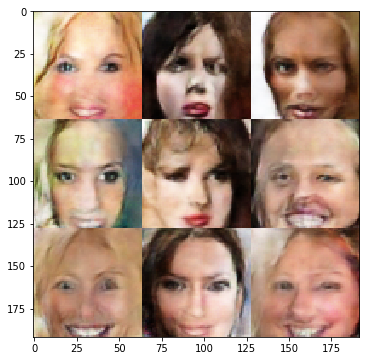

Epoch 8/10... Discr. Loss: 0.8689... Generator Loss: 1.3292
Epoch 8/10... Discr. Loss: 0.5243... Generator Loss: 2.7070
Epoch 8/10... Discr. Loss: 0.4556... Generator Loss: 2.9182
Epoch 8/10... Discr. Loss: 0.4781... Generator Loss: 2.5158
Epoch 8/10... Discr. Loss: 0.4370... Generator Loss: 2.6736
Epoch 8/10... Discr. Loss: 0.4261... Generator Loss: 2.8381
Epoch 8/10... Discr. Loss: 0.3841... Generator Loss: 3.1519
Epoch 8/10... Discr. Loss: 0.4390... Generator Loss: 2.9317
Epoch 8/10... Discr. Loss: 0.4062... Generator Loss: 2.9629
Epoch 8/10... Discr. Loss: 0.4610... Generator Loss: 2.7760
Epoch 8/10... Discr. Loss: 0.5948... Generator Loss: 2.4736
Epoch 8/10... Discr. Loss: 0.4297... Generator Loss: 2.9676
Epoch 8/10... Discr. Loss: 0.4111... Generator Loss: 3.1001
Epoch 8/10... Discr. Loss: 0.3674... Generator Loss: 3.6362
Epoch 8/10... Discr. Loss: 0.3733... Generator Loss: 3.2666
Epoch 8/10... Discr. Loss: 0.3974... Generator Loss: 3.4854
Epoch 8/10... Discr. Loss: 1.5454... Gen

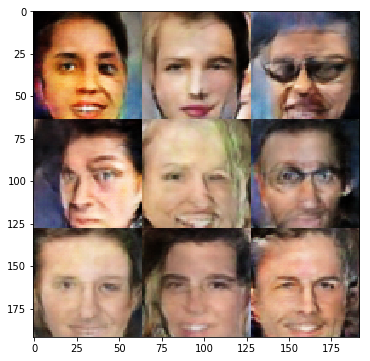

Epoch 8/10... Discr. Loss: 0.6236... Generator Loss: 2.8528
Epoch 8/10... Discr. Loss: 0.3578... Generator Loss: 3.2985
Epoch 8/10... Discr. Loss: 0.5396... Generator Loss: 3.8585
Epoch 8/10... Discr. Loss: 0.4588... Generator Loss: 2.6154
Epoch 8/10... Discr. Loss: 0.4091... Generator Loss: 2.8320
Epoch 8/10... Discr. Loss: 0.4137... Generator Loss: 2.8311
Epoch 8/10... Discr. Loss: 0.4035... Generator Loss: 3.1939
Epoch 8/10... Discr. Loss: 0.4536... Generator Loss: 2.5537
Epoch 8/10... Discr. Loss: 0.4412... Generator Loss: 2.9782
Epoch 8/10... Discr. Loss: 0.3955... Generator Loss: 3.1840
Epoch 8/10... Discr. Loss: 0.4129... Generator Loss: 3.2543
Epoch 8/10... Discr. Loss: 0.4430... Generator Loss: 2.4155
Epoch 8/10... Discr. Loss: 0.3978... Generator Loss: 3.4282
Epoch 8/10... Discr. Loss: 0.4289... Generator Loss: 2.5775
Epoch 8/10... Discr. Loss: 0.3751... Generator Loss: 3.7212
Epoch 8/10... Discr. Loss: 2.5569... Generator Loss: 1.5869
Epoch 8/10... Discr. Loss: 1.2750... Gen

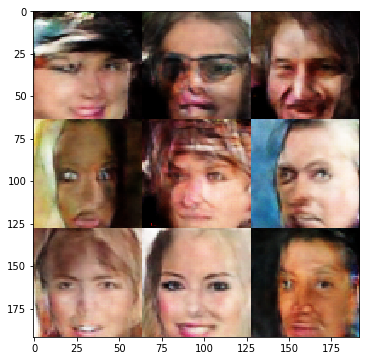

Epoch 8/10... Discr. Loss: 0.5389... Generator Loss: 2.0039
Epoch 8/10... Discr. Loss: 0.4860... Generator Loss: 2.9750
Epoch 8/10... Discr. Loss: 0.4232... Generator Loss: 2.6240
Epoch 8/10... Discr. Loss: 0.4523... Generator Loss: 3.7529
Epoch 8/10... Discr. Loss: 0.4622... Generator Loss: 3.2436
Epoch 8/10... Discr. Loss: 0.4049... Generator Loss: 3.0532
Epoch 8/10... Discr. Loss: 0.4442... Generator Loss: 3.1263
Epoch 8/10... Discr. Loss: 0.4027... Generator Loss: 2.8930
Epoch 8/10... Discr. Loss: 0.4412... Generator Loss: 2.6736
Epoch 8/10... Discr. Loss: 0.4476... Generator Loss: 3.4784
Epoch 8/10... Discr. Loss: 0.3586... Generator Loss: 3.3579
Epoch 8/10... Discr. Loss: 0.3714... Generator Loss: 3.3059
Epoch 8/10... Discr. Loss: 0.4240... Generator Loss: 3.6623
Epoch 8/10... Discr. Loss: 0.6752... Generator Loss: 3.4930
Epoch 8/10... Discr. Loss: 1.0964... Generator Loss: 0.9808
Epoch 8/10... Discr. Loss: 0.4700... Generator Loss: 2.9697
Epoch 8/10... Discr. Loss: 0.4219... Gen

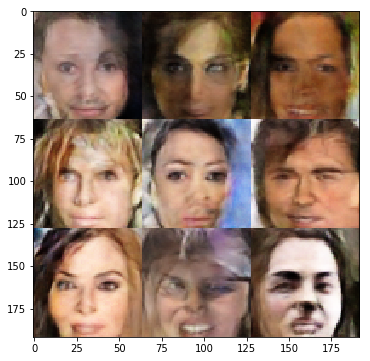

Epoch 8/10... Discr. Loss: 0.4860... Generator Loss: 3.6332
Epoch 8/10... Discr. Loss: 0.4016... Generator Loss: 3.0345
Epoch 8/10... Discr. Loss: 0.3586... Generator Loss: 3.5239
Epoch 8/10... Discr. Loss: 0.3804... Generator Loss: 3.3300
Epoch 8/10... Discr. Loss: 1.3918... Generator Loss: 4.8694
Epoch 8/10... Discr. Loss: 1.4578... Generator Loss: 0.8264
Epoch 8/10... Discr. Loss: 0.7827... Generator Loss: 2.7828
Epoch 8/10... Discr. Loss: 0.5360... Generator Loss: 2.4064
Epoch 8/10... Discr. Loss: 0.4672... Generator Loss: 3.0560
Epoch 8/10... Discr. Loss: 0.3960... Generator Loss: 3.1865
Epoch 8/10... Discr. Loss: 0.4062... Generator Loss: 2.9555
Epoch 8/10... Discr. Loss: 0.3570... Generator Loss: 2.8308
Epoch 8/10... Discr. Loss: 0.4414... Generator Loss: 2.7607
Epoch 8/10... Discr. Loss: 0.4065... Generator Loss: 2.9541
Epoch 8/10... Discr. Loss: 0.4089... Generator Loss: 3.1135
Epoch 8/10... Discr. Loss: 0.3675... Generator Loss: 3.0821
Epoch 8/10... Discr. Loss: 0.3805... Gen

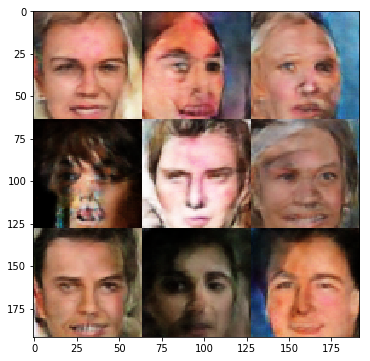

Epoch 8/10... Discr. Loss: 0.4270... Generator Loss: 3.3041
Epoch 8/10... Discr. Loss: 0.9972... Generator Loss: 1.0942
Epoch 8/10... Discr. Loss: 0.9209... Generator Loss: 2.4815
Epoch 8/10... Discr. Loss: 0.4555... Generator Loss: 2.7972
Epoch 8/10... Discr. Loss: 0.5245... Generator Loss: 2.0962
Epoch 8/10... Discr. Loss: 0.3716... Generator Loss: 3.7790
Epoch 8/10... Discr. Loss: 0.3990... Generator Loss: 3.2571
Epoch 8/10... Discr. Loss: 0.4376... Generator Loss: 2.5507
Epoch 8/10... Discr. Loss: 0.5662... Generator Loss: 1.9951
Epoch 8/10... Discr. Loss: 0.4597... Generator Loss: 2.6915
Epoch 8/10... Discr. Loss: 0.3865... Generator Loss: 3.2007
Epoch 8/10... Discr. Loss: 0.3855... Generator Loss: 3.7824
Epoch 8/10... Discr. Loss: 0.3911... Generator Loss: 3.8353
Epoch 8/10... Discr. Loss: 0.4003... Generator Loss: 3.0705
Epoch 8/10... Discr. Loss: 0.3640... Generator Loss: 3.4784
Epoch 8/10... Discr. Loss: 0.3696... Generator Loss: 3.5843
Epoch 8/10... Discr. Loss: 0.7451... Gen

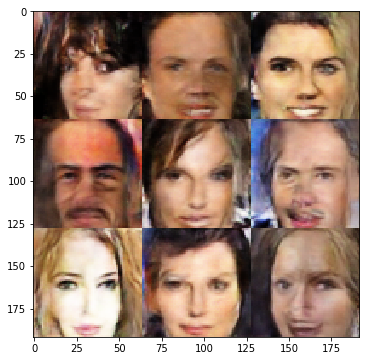

Epoch 8/10... Discr. Loss: 0.4316... Generator Loss: 2.6989
Epoch 8/10... Discr. Loss: 0.3602... Generator Loss: 3.3471
Epoch 8/10... Discr. Loss: 0.4193... Generator Loss: 3.5019
Epoch 8/10... Discr. Loss: 0.3632... Generator Loss: 4.0231
Epoch 8/10... Discr. Loss: 0.4039... Generator Loss: 2.8639
Epoch 8/10... Discr. Loss: 0.4065... Generator Loss: 3.8863
Epoch 8/10... Discr. Loss: 0.4249... Generator Loss: 4.1875
Epoch 8/10... Discr. Loss: 0.4214... Generator Loss: 3.0346
Epoch 8/10... Discr. Loss: 0.3930... Generator Loss: 3.3756
Epoch 8/10... Discr. Loss: 0.3799... Generator Loss: 2.8569
Epoch 8/10... Discr. Loss: 2.4197... Generator Loss: 0.3897
Epoch 8/10... Discr. Loss: 0.6445... Generator Loss: 2.4192
Epoch 8/10... Discr. Loss: 0.6234... Generator Loss: 1.8570
Epoch 8/10... Discr. Loss: 0.3553... Generator Loss: 3.4506
Epoch 8/10... Discr. Loss: 0.4132... Generator Loss: 2.6880
Epoch 8/10... Discr. Loss: 0.4542... Generator Loss: 2.8860
Epoch 8/10... Discr. Loss: 0.3842... Gen

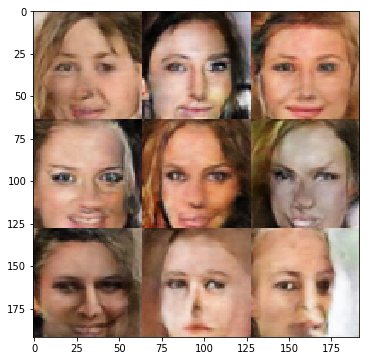

Epoch 8/10... Discr. Loss: 0.4194... Generator Loss: 2.7542
Epoch 8/10... Discr. Loss: 0.3809... Generator Loss: 4.0821
Epoch 8/10... Discr. Loss: 0.3696... Generator Loss: 3.0600
Epoch 8/10... Discr. Loss: 0.3545... Generator Loss: 3.3642
Epoch 8/10... Discr. Loss: 0.3884... Generator Loss: 3.6216
Epoch 8/10... Discr. Loss: 0.5658... Generator Loss: 2.0748
Epoch 8/10... Discr. Loss: 0.3703... Generator Loss: 3.9439
Epoch 8/10... Discr. Loss: 0.3474... Generator Loss: 3.3701
Epoch 8/10... Discr. Loss: 0.3611... Generator Loss: 3.9904
Epoch 8/10... Discr. Loss: 0.3985... Generator Loss: 2.7818
Epoch 8/10... Discr. Loss: 0.4077... Generator Loss: 2.9630
Epoch 8/10... Discr. Loss: 0.3776... Generator Loss: 3.4201
Epoch 8/10... Discr. Loss: 0.6227... Generator Loss: 3.7950
Epoch 8/10... Discr. Loss: 2.1415... Generator Loss: 4.0502
Epoch 8/10... Discr. Loss: 0.5715... Generator Loss: 3.1781
Epoch 8/10... Discr. Loss: 0.4650... Generator Loss: 2.3664
Epoch 8/10... Discr. Loss: 0.4594... Gen

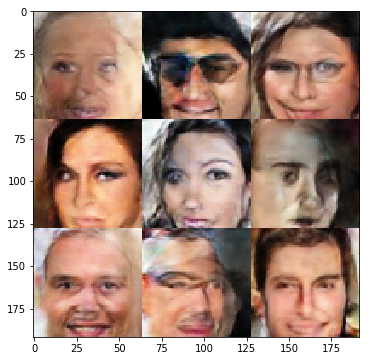

Epoch 8/10... Discr. Loss: 0.3727... Generator Loss: 3.2593
Epoch 8/10... Discr. Loss: 0.4236... Generator Loss: 3.2971
Epoch 8/10... Discr. Loss: 0.5116... Generator Loss: 2.1435
Epoch 8/10... Discr. Loss: 0.3835... Generator Loss: 2.9005
Epoch 8/10... Discr. Loss: 0.3611... Generator Loss: 3.7853
Epoch 9/10... Discr. Loss: 0.3679... Generator Loss: 2.7402
Epoch 9/10... Discr. Loss: 0.3777... Generator Loss: 3.7132
Epoch 9/10... Discr. Loss: 0.6106... Generator Loss: 2.9199
Epoch 9/10... Discr. Loss: 0.3941... Generator Loss: 2.9968
Epoch 9/10... Discr. Loss: 3.0444... Generator Loss: 2.3478
Epoch 9/10... Discr. Loss: 1.2671... Generator Loss: 1.3833
Epoch 9/10... Discr. Loss: 0.7921... Generator Loss: 3.8556
Epoch 9/10... Discr. Loss: 0.9796... Generator Loss: 1.7755
Epoch 9/10... Discr. Loss: 0.6011... Generator Loss: 1.9173
Epoch 9/10... Discr. Loss: 0.4306... Generator Loss: 3.0664
Epoch 9/10... Discr. Loss: 0.6449... Generator Loss: 3.7874
Epoch 9/10... Discr. Loss: 0.4284... Gen

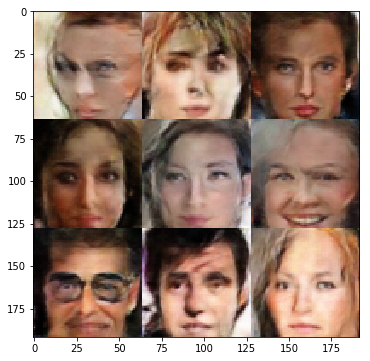

Epoch 9/10... Discr. Loss: 0.3641... Generator Loss: 3.4147
Epoch 9/10... Discr. Loss: 0.3829... Generator Loss: 3.2015
Epoch 9/10... Discr. Loss: 0.5997... Generator Loss: 3.8860
Epoch 9/10... Discr. Loss: 0.5883... Generator Loss: 2.0493
Epoch 9/10... Discr. Loss: 0.4123... Generator Loss: 2.8844
Epoch 9/10... Discr. Loss: 0.4725... Generator Loss: 3.7695
Epoch 9/10... Discr. Loss: 0.3830... Generator Loss: 3.1936
Epoch 9/10... Discr. Loss: 0.3795... Generator Loss: 3.7271
Epoch 9/10... Discr. Loss: 0.3569... Generator Loss: 3.4742
Epoch 9/10... Discr. Loss: 0.3733... Generator Loss: 2.9576
Epoch 9/10... Discr. Loss: 0.3886... Generator Loss: 3.0643
Epoch 9/10... Discr. Loss: 0.3458... Generator Loss: 4.0660
Epoch 9/10... Discr. Loss: 0.3506... Generator Loss: 3.1090
Epoch 9/10... Discr. Loss: 0.7841... Generator Loss: 4.4226
Epoch 9/10... Discr. Loss: 0.4696... Generator Loss: 3.0453
Epoch 9/10... Discr. Loss: 0.3783... Generator Loss: 3.8454
Epoch 9/10... Discr. Loss: 0.4379... Gen

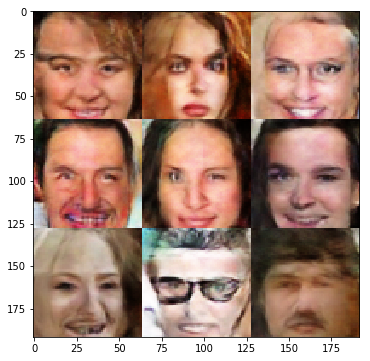

Epoch 9/10... Discr. Loss: 0.3741... Generator Loss: 4.6213
Epoch 9/10... Discr. Loss: 2.5883... Generator Loss: 0.4521
Epoch 9/10... Discr. Loss: 1.6604... Generator Loss: 5.0516
Epoch 9/10... Discr. Loss: 0.5295... Generator Loss: 2.3853
Epoch 9/10... Discr. Loss: 0.5807... Generator Loss: 4.0119
Epoch 9/10... Discr. Loss: 0.4155... Generator Loss: 2.9013
Epoch 9/10... Discr. Loss: 0.4141... Generator Loss: 2.7873
Epoch 9/10... Discr. Loss: 0.3457... Generator Loss: 3.5636
Epoch 9/10... Discr. Loss: 0.4401... Generator Loss: 3.8061
Epoch 9/10... Discr. Loss: 1.3281... Generator Loss: 1.3283
Epoch 9/10... Discr. Loss: 0.7451... Generator Loss: 3.2729
Epoch 9/10... Discr. Loss: 0.8071... Generator Loss: 1.6478
Epoch 9/10... Discr. Loss: 0.5763... Generator Loss: 4.3790
Epoch 9/10... Discr. Loss: 0.4412... Generator Loss: 2.7599
Epoch 9/10... Discr. Loss: 0.4276... Generator Loss: 2.7329
Epoch 9/10... Discr. Loss: 0.3813... Generator Loss: 3.2607
Epoch 9/10... Discr. Loss: 0.3529... Gen

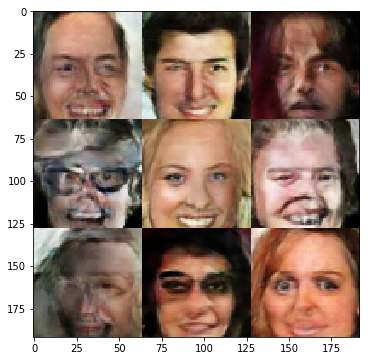

Epoch 9/10... Discr. Loss: 0.3930... Generator Loss: 3.4241
Epoch 9/10... Discr. Loss: 0.4100... Generator Loss: 3.1311
Epoch 9/10... Discr. Loss: 0.3726... Generator Loss: 3.3099
Epoch 9/10... Discr. Loss: 0.3809... Generator Loss: 3.0795
Epoch 9/10... Discr. Loss: 0.3561... Generator Loss: 3.3881
Epoch 9/10... Discr. Loss: 0.4049... Generator Loss: 4.0555
Epoch 9/10... Discr. Loss: 0.3860... Generator Loss: 2.7732
Epoch 9/10... Discr. Loss: 0.3054... Generator Loss: 3.9065
Epoch 9/10... Discr. Loss: 0.5765... Generator Loss: 2.0233
Epoch 9/10... Discr. Loss: 0.4051... Generator Loss: 3.4159
Epoch 9/10... Discr. Loss: 0.3574... Generator Loss: 3.1394
Epoch 9/10... Discr. Loss: 0.3526... Generator Loss: 3.0484
Epoch 9/10... Discr. Loss: 0.4455... Generator Loss: 2.4503
Epoch 9/10... Discr. Loss: 0.3689... Generator Loss: 3.5598
Epoch 9/10... Discr. Loss: 0.5318... Generator Loss: 2.2106
Epoch 9/10... Discr. Loss: 0.3353... Generator Loss: 3.9758
Epoch 9/10... Discr. Loss: 0.3359... Gen

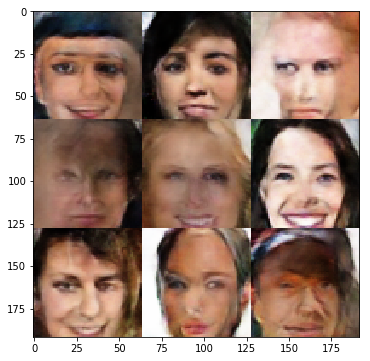

Epoch 9/10... Discr. Loss: 2.1943... Generator Loss: 2.0636
Epoch 9/10... Discr. Loss: 0.5360... Generator Loss: 2.5265
Epoch 9/10... Discr. Loss: 0.3789... Generator Loss: 3.9231
Epoch 9/10... Discr. Loss: 0.3448... Generator Loss: 3.5366
Epoch 9/10... Discr. Loss: 0.5546... Generator Loss: 4.0747
Epoch 9/10... Discr. Loss: 1.3106... Generator Loss: 0.8226
Epoch 9/10... Discr. Loss: 0.5634... Generator Loss: 2.1252
Epoch 9/10... Discr. Loss: 0.5111... Generator Loss: 4.0276
Epoch 9/10... Discr. Loss: 0.3473... Generator Loss: 3.6616
Epoch 9/10... Discr. Loss: 0.4758... Generator Loss: 2.7105
Epoch 9/10... Discr. Loss: 0.4016... Generator Loss: 2.9581
Epoch 9/10... Discr. Loss: 0.3883... Generator Loss: 3.5482
Epoch 9/10... Discr. Loss: 0.3999... Generator Loss: 2.9688
Epoch 9/10... Discr. Loss: 0.3804... Generator Loss: 2.8952
Epoch 9/10... Discr. Loss: 0.3569... Generator Loss: 3.2561
Epoch 9/10... Discr. Loss: 0.3507... Generator Loss: 4.4885
Epoch 9/10... Discr. Loss: 0.4483... Gen

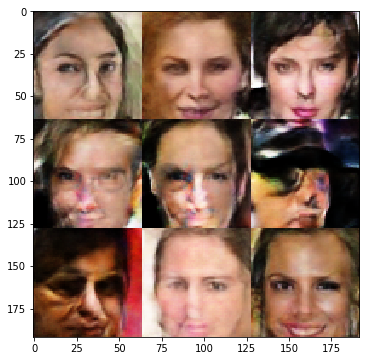

Epoch 9/10... Discr. Loss: 0.3461... Generator Loss: 3.2363
Epoch 9/10... Discr. Loss: 0.3431... Generator Loss: 3.2761
Epoch 9/10... Discr. Loss: 0.3356... Generator Loss: 3.7823
Epoch 9/10... Discr. Loss: 0.3882... Generator Loss: 3.3825
Epoch 9/10... Discr. Loss: 0.3388... Generator Loss: 3.7552
Epoch 9/10... Discr. Loss: 0.5722... Generator Loss: 2.0514
Epoch 9/10... Discr. Loss: 0.3312... Generator Loss: 4.2460
Epoch 9/10... Discr. Loss: 0.3365... Generator Loss: 4.2865
Epoch 9/10... Discr. Loss: 0.3395... Generator Loss: 3.6246
Epoch 9/10... Discr. Loss: 0.3299... Generator Loss: 3.9657
Epoch 9/10... Discr. Loss: 0.4363... Generator Loss: 5.1706
Epoch 9/10... Discr. Loss: 0.3513... Generator Loss: 4.4679
Epoch 9/10... Discr. Loss: 0.4118... Generator Loss: 3.8843
Epoch 9/10... Discr. Loss: 0.3917... Generator Loss: 3.8743
Epoch 9/10... Discr. Loss: 0.3708... Generator Loss: 3.6647
Epoch 9/10... Discr. Loss: 0.3217... Generator Loss: 4.1900
Epoch 9/10... Discr. Loss: 2.6974... Gen

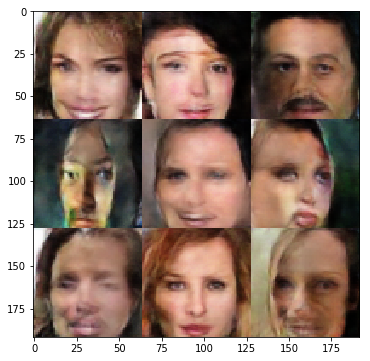

Epoch 9/10... Discr. Loss: 0.3628... Generator Loss: 3.2540
Epoch 9/10... Discr. Loss: 0.3392... Generator Loss: 3.4644
Epoch 9/10... Discr. Loss: 0.3955... Generator Loss: 3.0994
Epoch 9/10... Discr. Loss: 0.3648... Generator Loss: 3.8248
Epoch 9/10... Discr. Loss: 0.3276... Generator Loss: 3.7176
Epoch 9/10... Discr. Loss: 0.6646... Generator Loss: 4.4752
Epoch 9/10... Discr. Loss: 0.3931... Generator Loss: 3.0542
Epoch 9/10... Discr. Loss: 0.3388... Generator Loss: 3.5253
Epoch 9/10... Discr. Loss: 0.3317... Generator Loss: 4.1661
Epoch 9/10... Discr. Loss: 0.3720... Generator Loss: 4.0803
Epoch 9/10... Discr. Loss: 0.3872... Generator Loss: 3.8242
Epoch 9/10... Discr. Loss: 0.3377... Generator Loss: 3.7665
Epoch 9/10... Discr. Loss: 0.3617... Generator Loss: 3.2845
Epoch 9/10... Discr. Loss: 0.3661... Generator Loss: 3.2251
Epoch 9/10... Discr. Loss: 0.3444... Generator Loss: 3.6601
Epoch 9/10... Discr. Loss: 0.4916... Generator Loss: 4.8850
Epoch 9/10... Discr. Loss: 0.6938... Gen

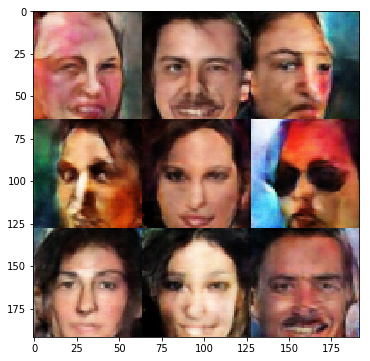

Epoch 9/10... Discr. Loss: 0.3555... Generator Loss: 3.4535
Epoch 9/10... Discr. Loss: 0.4041... Generator Loss: 2.9686
Epoch 9/10... Discr. Loss: 0.3690... Generator Loss: 3.3003
Epoch 9/10... Discr. Loss: 0.3594... Generator Loss: 3.1496
Epoch 9/10... Discr. Loss: 0.3679... Generator Loss: 4.3493
Epoch 9/10... Discr. Loss: 0.3451... Generator Loss: 3.0627
Epoch 9/10... Discr. Loss: 0.3595... Generator Loss: 3.4404
Epoch 9/10... Discr. Loss: 0.5105... Generator Loss: 2.2710
Epoch 9/10... Discr. Loss: 0.3953... Generator Loss: 4.4947
Epoch 9/10... Discr. Loss: 0.3377... Generator Loss: 3.8117
Epoch 9/10... Discr. Loss: 0.3274... Generator Loss: 4.1700
Epoch 9/10... Discr. Loss: 0.3611... Generator Loss: 3.1349
Epoch 9/10... Discr. Loss: 0.3267... Generator Loss: 3.9260
Epoch 9/10... Discr. Loss: 0.3698... Generator Loss: 3.3379
Epoch 9/10... Discr. Loss: 0.7856... Generator Loss: 1.3915
Epoch 9/10... Discr. Loss: 0.3770... Generator Loss: 3.1536
Epoch 9/10... Discr. Loss: 0.3673... Gen

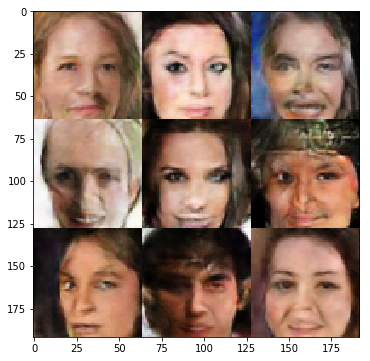

Epoch 9/10... Discr. Loss: 0.3739... Generator Loss: 3.5249
Epoch 9/10... Discr. Loss: 0.3247... Generator Loss: 3.9596
Epoch 9/10... Discr. Loss: 0.3476... Generator Loss: 3.7619
Epoch 10/10... Discr. Loss: 0.3545... Generator Loss: 3.6987
Epoch 10/10... Discr. Loss: 0.3883... Generator Loss: 4.3930
Epoch 10/10... Discr. Loss: 0.3154... Generator Loss: 3.8418
Epoch 10/10... Discr. Loss: 0.4114... Generator Loss: 4.3828
Epoch 10/10... Discr. Loss: 0.3475... Generator Loss: 4.1479
Epoch 10/10... Discr. Loss: 0.3384... Generator Loss: 3.3335
Epoch 10/10... Discr. Loss: 0.3896... Generator Loss: 4.1505
Epoch 10/10... Discr. Loss: 2.1010... Generator Loss: 5.6071
Epoch 10/10... Discr. Loss: 1.6315... Generator Loss: 1.2574
Epoch 10/10... Discr. Loss: 1.2762... Generator Loss: 1.6252
Epoch 10/10... Discr. Loss: 1.1290... Generator Loss: 3.0902
Epoch 10/10... Discr. Loss: 0.5137... Generator Loss: 3.4668
Epoch 10/10... Discr. Loss: 0.4084... Generator Loss: 3.3027
Epoch 10/10... Discr. Loss:

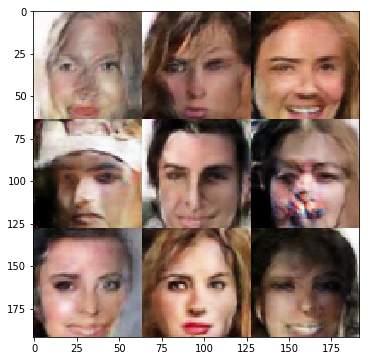

Epoch 10/10... Discr. Loss: 0.3496... Generator Loss: 3.3986
Epoch 10/10... Discr. Loss: 0.3850... Generator Loss: 4.4037
Epoch 10/10... Discr. Loss: 0.4081... Generator Loss: 3.7696
Epoch 10/10... Discr. Loss: 0.3580... Generator Loss: 3.7242
Epoch 10/10... Discr. Loss: 0.3847... Generator Loss: 3.7130
Epoch 10/10... Discr. Loss: 0.3848... Generator Loss: 2.8722
Epoch 10/10... Discr. Loss: 0.7047... Generator Loss: 4.7711
Epoch 10/10... Discr. Loss: 0.3953... Generator Loss: 3.6696
Epoch 10/10... Discr. Loss: 0.3442... Generator Loss: 3.2493
Epoch 10/10... Discr. Loss: 0.3192... Generator Loss: 4.0058
Epoch 10/10... Discr. Loss: 0.3493... Generator Loss: 4.0396
Epoch 10/10... Discr. Loss: 0.3382... Generator Loss: 3.3934
Epoch 10/10... Discr. Loss: 0.7671... Generator Loss: 1.6720
Epoch 10/10... Discr. Loss: 0.5739... Generator Loss: 2.2861
Epoch 10/10... Discr. Loss: 0.4113... Generator Loss: 4.0545
Epoch 10/10... Discr. Loss: 0.3842... Generator Loss: 2.9446
Epoch 10/10... Discr. Lo

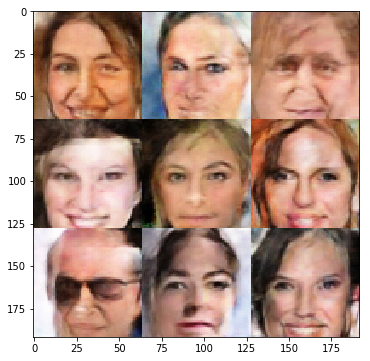

Epoch 10/10... Discr. Loss: 0.3400... Generator Loss: 4.0754
Epoch 10/10... Discr. Loss: 0.3979... Generator Loss: 4.5642
Epoch 10/10... Discr. Loss: 0.3063... Generator Loss: 4.2719
Epoch 10/10... Discr. Loss: 0.3301... Generator Loss: 3.9223
Epoch 10/10... Discr. Loss: 0.3298... Generator Loss: 4.0195
Epoch 10/10... Discr. Loss: 0.3863... Generator Loss: 4.3995
Epoch 10/10... Discr. Loss: 0.3111... Generator Loss: 4.2091
Epoch 10/10... Discr. Loss: 0.8755... Generator Loss: 3.7411
Epoch 10/10... Discr. Loss: 1.5121... Generator Loss: 2.0332
Epoch 10/10... Discr. Loss: 2.1811... Generator Loss: 0.9861
Epoch 10/10... Discr. Loss: 0.4806... Generator Loss: 3.4174
Epoch 10/10... Discr. Loss: 0.3845... Generator Loss: 3.5782
Epoch 10/10... Discr. Loss: 0.4490... Generator Loss: 2.7759
Epoch 10/10... Discr. Loss: 0.3362... Generator Loss: 3.7408
Epoch 10/10... Discr. Loss: 0.3582... Generator Loss: 3.9847
Epoch 10/10... Discr. Loss: 0.3300... Generator Loss: 3.7819
Epoch 10/10... Discr. Lo

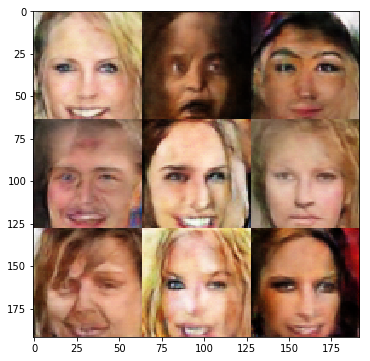

Epoch 10/10... Discr. Loss: 0.4387... Generator Loss: 2.6908
Epoch 10/10... Discr. Loss: 0.3672... Generator Loss: 3.3666
Epoch 10/10... Discr. Loss: 0.3587... Generator Loss: 3.4174
Epoch 10/10... Discr. Loss: 0.3463... Generator Loss: 4.1146
Epoch 10/10... Discr. Loss: 0.3713... Generator Loss: 3.8743
Epoch 10/10... Discr. Loss: 0.3360... Generator Loss: 3.6937
Epoch 10/10... Discr. Loss: 0.3503... Generator Loss: 3.4880
Epoch 10/10... Discr. Loss: 0.3389... Generator Loss: 4.1957
Epoch 10/10... Discr. Loss: 0.3991... Generator Loss: 2.9491
Epoch 10/10... Discr. Loss: 0.5906... Generator Loss: 3.7888
Epoch 10/10... Discr. Loss: 0.5010... Generator Loss: 2.4569
Epoch 10/10... Discr. Loss: 0.3473... Generator Loss: 3.2830
Epoch 10/10... Discr. Loss: 0.3714... Generator Loss: 3.7883
Epoch 10/10... Discr. Loss: 0.3395... Generator Loss: 3.8226
Epoch 10/10... Discr. Loss: 0.3610... Generator Loss: 3.2169
Epoch 10/10... Discr. Loss: 0.3294... Generator Loss: 3.4864
Epoch 10/10... Discr. Lo

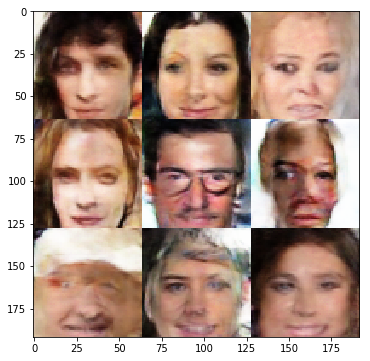

Epoch 10/10... Discr. Loss: 0.4321... Generator Loss: 3.5703
Epoch 10/10... Discr. Loss: 0.3249... Generator Loss: 4.0549
Epoch 10/10... Discr. Loss: 0.3540... Generator Loss: 3.5459
Epoch 10/10... Discr. Loss: 0.3292... Generator Loss: 3.7450
Epoch 10/10... Discr. Loss: 0.3744... Generator Loss: 3.5973
Epoch 10/10... Discr. Loss: 0.3155... Generator Loss: 4.1517
Epoch 10/10... Discr. Loss: 0.3241... Generator Loss: 3.3359
Epoch 10/10... Discr. Loss: 0.3391... Generator Loss: 3.5176
Epoch 10/10... Discr. Loss: 0.3789... Generator Loss: 3.1692
Epoch 10/10... Discr. Loss: 0.3843... Generator Loss: 3.1395
Epoch 10/10... Discr. Loss: 0.3315... Generator Loss: 3.7287
Epoch 10/10... Discr. Loss: 0.3778... Generator Loss: 3.0522
Epoch 10/10... Discr. Loss: 0.3636... Generator Loss: 3.1787
Epoch 10/10... Discr. Loss: 0.3155... Generator Loss: 4.0813
Epoch 10/10... Discr. Loss: 0.3479... Generator Loss: 3.8584
Epoch 10/10... Discr. Loss: 0.3533... Generator Loss: 3.8344
Epoch 10/10... Discr. Lo

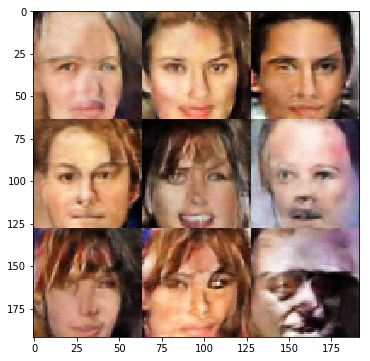

Epoch 10/10... Discr. Loss: 0.3226... Generator Loss: 3.9279
Epoch 10/10... Discr. Loss: 0.3331... Generator Loss: 3.6253
Epoch 10/10... Discr. Loss: 2.9570... Generator Loss: 4.0136
Epoch 10/10... Discr. Loss: 0.9683... Generator Loss: 2.7220
Epoch 10/10... Discr. Loss: 1.6241... Generator Loss: 2.1102
Epoch 10/10... Discr. Loss: 2.5835... Generator Loss: 3.8540
Epoch 10/10... Discr. Loss: 0.5428... Generator Loss: 2.5788
Epoch 10/10... Discr. Loss: 1.2728... Generator Loss: 1.0689
Epoch 10/10... Discr. Loss: 0.4081... Generator Loss: 3.4243
Epoch 10/10... Discr. Loss: 0.4407... Generator Loss: 2.9591
Epoch 10/10... Discr. Loss: 0.3356... Generator Loss: 3.3830
Epoch 10/10... Discr. Loss: 0.3515... Generator Loss: 3.4101
Epoch 10/10... Discr. Loss: 0.4345... Generator Loss: 2.9921
Epoch 10/10... Discr. Loss: 0.3862... Generator Loss: 2.8954
Epoch 10/10... Discr. Loss: 0.3826... Generator Loss: 2.9577
Epoch 10/10... Discr. Loss: 0.3953... Generator Loss: 3.1635
Epoch 10/10... Discr. Lo

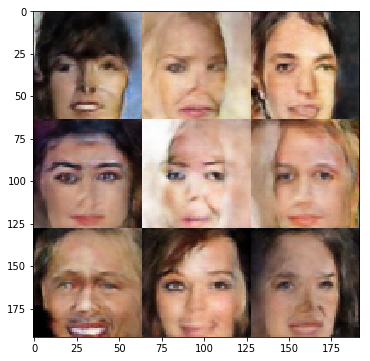

Epoch 10/10... Discr. Loss: 0.3539... Generator Loss: 3.5998
Epoch 10/10... Discr. Loss: 0.3480... Generator Loss: 3.1203
Epoch 10/10... Discr. Loss: 0.3233... Generator Loss: 3.9892
Epoch 10/10... Discr. Loss: 0.3424... Generator Loss: 3.5377
Epoch 10/10... Discr. Loss: 0.3638... Generator Loss: 3.3428
Epoch 10/10... Discr. Loss: 0.3087... Generator Loss: 4.4476
Epoch 10/10... Discr. Loss: 0.6163... Generator Loss: 2.0499
Epoch 10/10... Discr. Loss: 0.6370... Generator Loss: 2.3129
Epoch 10/10... Discr. Loss: 0.5436... Generator Loss: 2.1972
Epoch 10/10... Discr. Loss: 0.3595... Generator Loss: 3.6684
Epoch 10/10... Discr. Loss: 0.3240... Generator Loss: 3.8710
Epoch 10/10... Discr. Loss: 0.3749... Generator Loss: 4.0409
Epoch 10/10... Discr. Loss: 0.3198... Generator Loss: 3.7821
Epoch 10/10... Discr. Loss: 0.3094... Generator Loss: 4.2473
Epoch 10/10... Discr. Loss: 0.3186... Generator Loss: 4.0368
Epoch 10/10... Discr. Loss: 0.3278... Generator Loss: 4.0403
Epoch 10/10... Discr. Lo

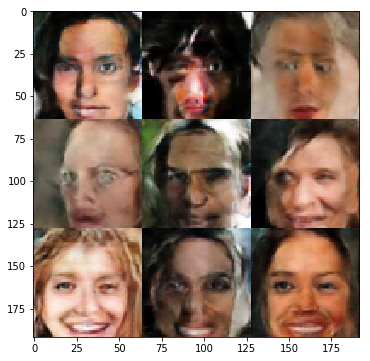

Epoch 10/10... Discr. Loss: 0.3425... Generator Loss: 3.6184
Epoch 10/10... Discr. Loss: 2.9488... Generator Loss: 6.3401
Epoch 10/10... Discr. Loss: 0.6244... Generator Loss: 2.0507
Epoch 10/10... Discr. Loss: 0.4151... Generator Loss: 4.0969
Epoch 10/10... Discr. Loss: 0.3505... Generator Loss: 3.3881
Epoch 10/10... Discr. Loss: 0.3340... Generator Loss: 3.8323
Epoch 10/10... Discr. Loss: 0.4344... Generator Loss: 4.1380
Epoch 10/10... Discr. Loss: 0.3728... Generator Loss: 3.2631
Epoch 10/10... Discr. Loss: 0.3400... Generator Loss: 3.4739
Epoch 10/10... Discr. Loss: 0.3555... Generator Loss: 4.0012
Epoch 10/10... Discr. Loss: 0.3233... Generator Loss: 3.9619
Epoch 10/10... Discr. Loss: 0.3302... Generator Loss: 3.5261
Epoch 10/10... Discr. Loss: 0.3155... Generator Loss: 3.7945
Epoch 10/10... Discr. Loss: 0.3409... Generator Loss: 3.6394
Epoch 10/10... Discr. Loss: 0.3408... Generator Loss: 3.5867
Epoch 10/10... Discr. Loss: 0.3323... Generator Loss: 3.9875
Epoch 10/10... Discr. Lo

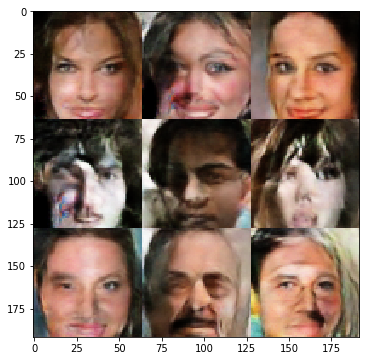

Epoch 10/10... Discr. Loss: 0.3122... Generator Loss: 3.7960
Epoch 10/10... Discr. Loss: 0.3036... Generator Loss: 3.8701


In [12]:
batch_size = 128
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset64('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))) #by using the modified helper function - Dataset64 we create pictures with size 64x64
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.